In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import func_plot as fp
import scipy.stats as ss
from matplotlib.colors import ListedColormap
import nibabel as nib
import hcp_utils as hcp
from statsmodels.regression.linear_model import OLS
from scipy.ndimage import gaussian_filter1d
import pingouin as pg

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
plt.rcParams["font.family"] = "Arial"

SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## load neccessary sources

In [3]:
mmp_fsLR = np.loadtxt('../../src/fs_LR.64k.mmp_360.txt')
ca = np.loadtxt('../../src/ca_glasser_network.csv',dtype=str,delimiter=',')[:,0].astype(float)

## Plot gradients

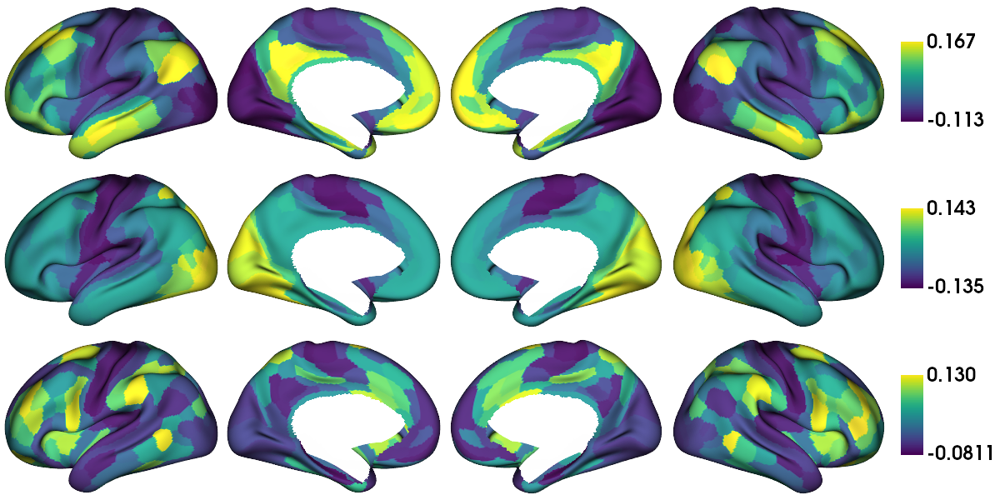

In [4]:
spa='0.9'
hcp_grad = np.loadtxt('../../data/HCP_group_grad_mmp_'+spa+'.txt')
plot = [None] * 3
for i in range(3):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = hcp_grad[:,i][node]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR', nan_color=(1,1,1,0.01),
                size = (1200, 600), #color_range=(-0.05,0.05),
                cmap = 'viridis', filename = '../../figures/group_grad_hcp_'+spa+'.png',
                display=True)

[23.78821227 19.11813044 15.76529636  9.55978658  7.99441687  7.27331829
  5.82220175  3.9440076   3.62211267  3.11251718]


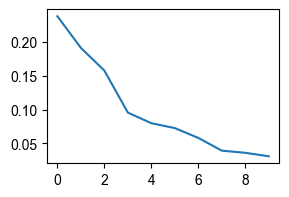

In [5]:
hcp_lambda = np.loadtxt('../../data/HCP_group_grad_mmp_lambdas'+spa+'.txt')

fig, ax = plt.subplots(figsize=(3,2))
ax.plot(range(10), hcp_lambda/hcp_lambda.sum())
print(hcp_lambda*100/hcp_lambda.sum())

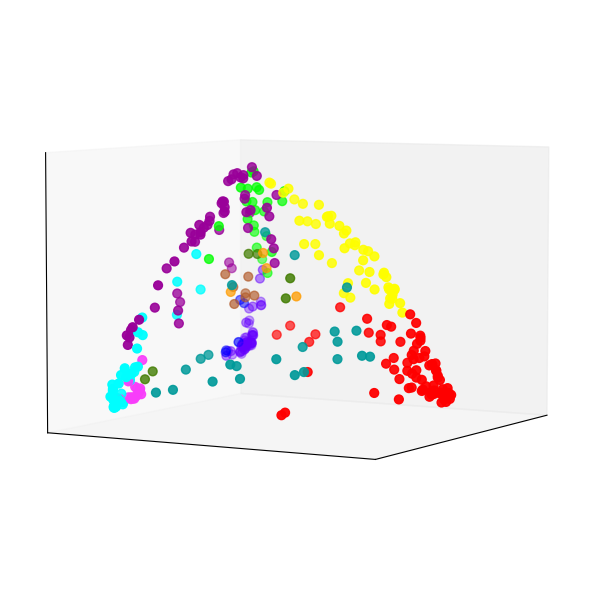

In [6]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
#plt.gca().patch.set_facecolor('white')
#ax.w_xaxis.set_pane_color((1, 1, 1, 0))
#ax.w_yaxis.set_pane_color((1, 1, 1, 0))
#ax.w_zaxis.set_pane_color((1, 1, 1, 0))
tmp_planes = ax.zaxis._PLANES 
ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                     tmp_planes[0], tmp_planes[1], 
                     tmp_planes[4], tmp_planes[5])
#ax.set_xticks(np.arange(-0.14, 0.14, 0.04))
#ax.set_yticks(np.arange(-0.14, 0.14, 0.04))
#ax.set_zticks(np.arange(-0.14, 0.14, 0.04))
#ax.set_xlabel('Gradient 1',labelpad=10)
#ax.set_ylabel('Gradient 2',labelpad=10)
#ax.set_zlabel('Gradient 3',labelpad=10)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#ax.grid(False)
ax.scatter(hcp_grad[:,0], hcp_grad[:,1],hcp_grad[:,2], s = 40, c = ca, cmap=fp.cmap_ca, marker = 'o')
ax.view_init(elev=5)
fig.tight_layout()
fig.savefig('../../figures/hcp_grad_3d_'+spa+'.png', dpi=300, transparent=True)

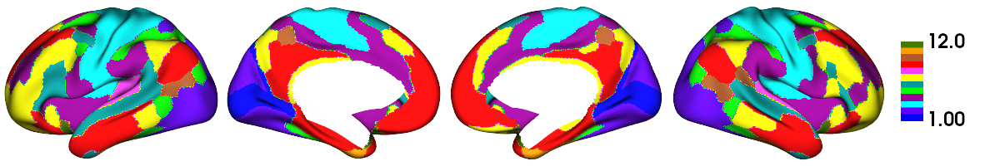

In [7]:
plot = mmp_fsLR.copy()
for node in range(360):
    plot[mmp_fsLR==node+1] = ca[node]
plot[mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR', nan_color=(1,1,1,0.01),
                size = (1200, 200), color_range=(1,12),
                cmap = fp.cmap_ca, filename = '../../figures/ca_atlas.png',
                display=True)

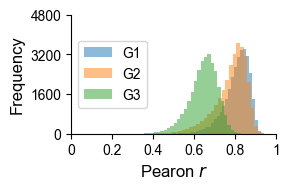

In [8]:
ukb_g1=pd.read_csv('../../data/gwas_summary/r_HCP_forGWAS_g1.txt', sep=' ')
ukb_g2=pd.read_csv('../../data/gwas_summary/r_HCP_forGWAS_g2.txt', sep=' ')
ukb_g3=pd.read_csv('../../data/gwas_summary/r_HCP_forGWAS_g3.txt', sep=' ')
ukb_fid = pd.read_csv('../../data/ukb_fid.csv')

ukb_g1=ukb_fid.merge(ukb_g1,on='FID')
ukb_g2=ukb_fid.merge(ukb_g2,on='FID')
ukb_g3=ukb_fid.merge(ukb_g3,on='FID')

ukb_g1.r_HCP[np.isnan(ukb_g1.r_HCP)] = ukb_g1.r_HCP.mean()
ukb_g2.r_HCP[np.isnan(ukb_g2.r_HCP)] = ukb_g2.r_HCP.mean()
ukb_g3.r_HCP[np.isnan(ukb_g3.r_HCP)] = ukb_g3.r_HCP.mean()

fig, ax = plt.subplots(1, figsize=(3,2))

ax.hist(ukb_g1.r_HCP, 40, label='G1', alpha=0.5)
ax.hist(ukb_g2.r_HCP, 40, label='G2', alpha=0.5)
ax.hist(ukb_g3.r_HCP, 40, label='G3', alpha=0.5)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
ax.set_xticklabels(['0','0.2','0.4','0.6','0.8','1'])
ax.set_yticks([0,1600,3200,4800])

ax.set_xlabel('Pearon $\it{r}$')
ax.set_ylabel('Frequency')

plt.legend(loc='center left')
fig.tight_layout()
fig.savefig('../../figures/ukb_grad_distribution.png', dpi=300, transparent=True)

In [9]:
ss.skew(ukb_g1.r_HCP), ss.skew(ukb_g2.r_HCP), ss.skew(ukb_g3.r_HCP)

(-1.1934384684761652, -1.2420862596888296, -0.7441334808930024)

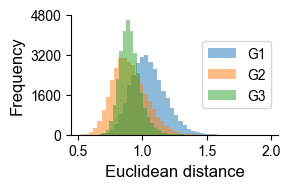

In [10]:
ed=pd.read_csv('../../results/euclidean_distance_0.9.csv', sep=' ', index_col=False)
ed=ukb_fid.merge(ed,on='FID')

fig, ax = plt.subplots(1, figsize=(3,2))

ax.hist(ed.g1, 40, label='G1', alpha=0.5)
ax.hist(ed.g2, 40, label='G2', alpha=0.5)
ax.hist(ed.g3, 40, label='G3', alpha=0.5)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

#ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
#ax.set_xticklabels(['0','0.2','0.4','0.6','0.8','1'])
ax.set_yticks([0,1600,3200,4800])

ax.set_xlabel('Euclidean distance')
ax.set_ylabel('Frequency')

plt.legend(loc='center right')
fig.tight_layout()
fig.savefig('../../figures/ukb_eucdis_distribution.png', dpi=300, transparent=True)

In [11]:
ss.skew(ed.g1), ss.skew(ed.g2), ss.skew(ed.g3)

(0.45925859356400134, 0.49264038221348905, 0.7456748755703736)

## AHBA

In [12]:
allen = pd.read_csv('../../data/allgenes_stable_r-1_glasser_360_imputed.csv')[:360]
np.savetxt('../../data/background_genes.txt', allen.columns[1:], fmt='%s')
allen

,label,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS,AADACL3,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,L_V1,0.255300,0.467575,0.556794,0.463683,0.451732,0.504193,0.756417,0.628109,0.482232,...,0.533296,0.422464,0.410805,0.460423,0.436940,0.465368,0.563228,0.899474,0.769298,0.274871
1,L_MST,0.435771,0.642531,0.469404,0.477482,0.440171,0.447792,0.587823,0.721418,0.427186,...,0.545944,0.532639,0.442947,0.415462,0.492970,0.440040,0.656558,0.729945,0.611534,0.436827
2,L_V6,0.477571,0.694668,0.532461,0.328712,0.351214,0.399805,0.725074,0.802839,0.438812,...,0.781993,0.678835,0.550026,0.337046,0.378223,0.327196,0.715595,0.895659,0.713067,0.337003
3,L_V2,0.266437,0.520304,0.449560,0.532687,0.492590,0.439828,0.635215,0.645843,0.473528,...,0.615795,0.554444,0.429524,0.458070,0.578736,0.471193,0.673949,0.835484,0.726136,0.347543
4,L_V3,0.342751,0.548158,0.422942,0.505038,0.444967,0.457009,0.627691,0.613044,0.541337,...,0.585906,0.505057,0.387863,0.408293,0.507875,0.459258,0.598146,0.835048,0.623957,0.313095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,R_STSva,0.779066,0.754274,0.334796,0.452991,0.492688,0.439557,0.521409,0.687522,0.527541,...,0.419692,0.468959,0.597881,0.594330,0.455411,0.504887,0.678428,0.614208,0.397011,0.699979
356,R_TE1m,0.751495,0.797151,0.522962,0.566865,0.486201,0.305017,0.693325,0.744361,0.316067,...,0.663880,0.545651,0.617500,0.512690,0.613818,0.418610,0.765771,0.629822,0.366123,0.627061
357,R_PI,0.715196,0.544296,0.368653,0.744282,0.350296,0.841778,0.466154,0.619706,0.247226,...,0.531317,0.643747,0.419970,0.423788,0.627835,0.640982,0.591887,0.444131,0.457741,0.671053
358,R_a32pr,0.560697,0.697351,0.498770,0.459440,0.440171,0.478168,0.535481,0.725120,0.427238,...,0.527242,0.544546,0.476899,0.432869,0.498964,0.437624,0.657003,0.614117,0.406211,0.506374


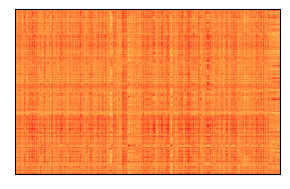

In [13]:
plot_data = np.array(allen[allen.columns[1:]]).copy()
plot_data[np.isnan(plot_data)] = 0

fig, ax = plt.subplots(1, figsize=(3,2))
ax.imshow(plot_data,cmap='YlOrRd', aspect='auto',
          vmin=0.3, vmax=0.7)
ax.set_xticks([])
ax.set_yticks([])

fig.tight_layout()
plt.savefig('../../figures/gene_bank.png', dpi=300, transparent=True)

In [14]:
mapped_genes = [ # Y means yes in allen brain, N means no in allen brain
    ['TBC1D12','HELLS','PAX8','PSD4','CBWD2','CYP2C9','CYP2C8','PLCE1','RABL2A','SLC20A1'], # Y,Y,Y,N,N,N,N,Y,Y,Y
    ['CLPTM1','CLASRP','TBC1D12','HELLS','PVRL2','APOE','TOMM40','APOC1','CYP2C9','CYP2C8']] # Y,Y,Y,Y,N,Y,Y,Y,N,N

magma_genes = [
    ['PLCE1','APOC1'], # Y,Y
    ['APOC1','TOMM40']] # Y,Y

In [15]:
mapped_genes = [ # Y means yes in allen brain, N means no in allen brain
    ['PLCE1','NOC3L','FAM200A'], # Y,Y,Y
    ['PLCE1','NOC3L','FAM200A'], # Y,Y,Y
    ['FAM200A'], # Y
    ['UFL1','FHL5','ANO1','PLCE1','FUT9','NOC3L','FAM200A'], # Y,Y,N,Y,Y,Y,Y
    ['PLCE1','NOC3L','FAM200A'], # Y,Y,Y
    ['TBC1D12','HELLS','ANO1','CYP2C9','CYP2C8','PLCE1','NOC3L','SLC35G1','RP11-805J14.3']] # Y,Y,N,N,N,Y,Y,N,N

# 'FAM200A' is 'C10orf91'

magma_genes = [
    ['GNA12','FHL5','AMZ1'], # Y,Y,Y
    [None],
    [None],
    ['ANO1','FHL5','UFL1'], # N,Y,Y
    ['PLCE1'], # Y
    ['PLCE1']] # Y

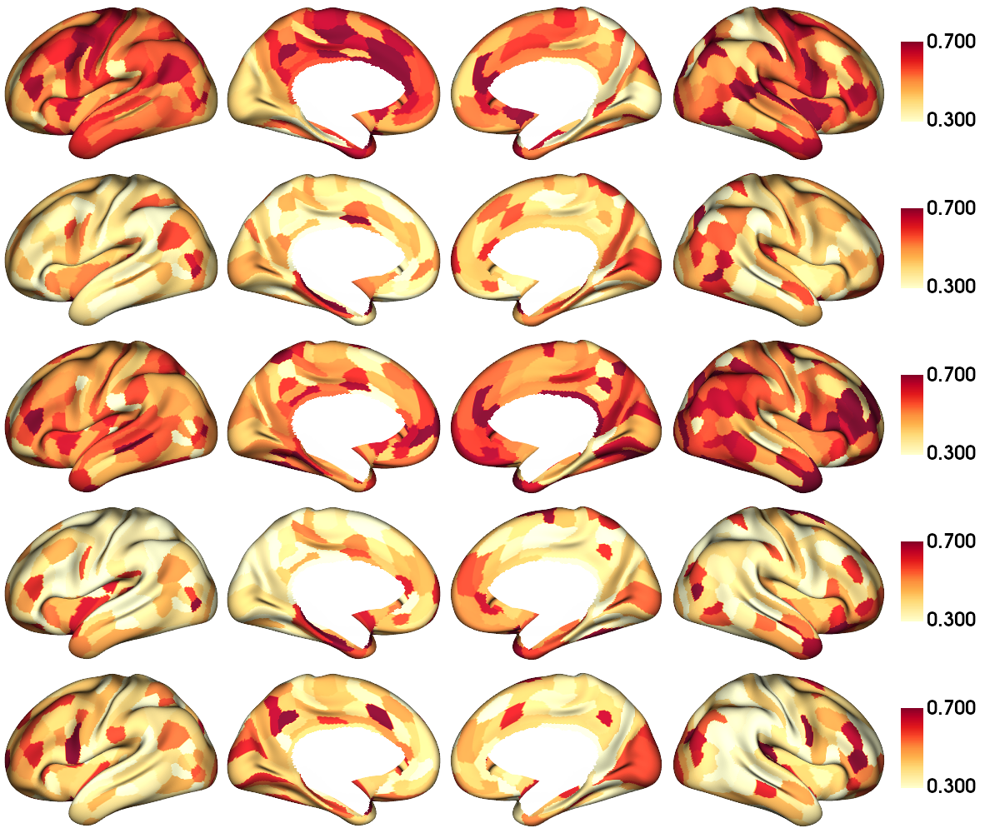

In [16]:
name = ['PLCE1','NOC3L','FAM200A',
        'UFL1','FHL5','FUT9',
        'TBC1D12','HELLS','GNA12','AMZ1']
df_genes = allen[name]
n=len(name)
plot=[None] * n
for num in range(n):
  plot[num] = mmp_fsLR.copy()
  for node in range(360):
    plot[num][mmp_fsLR==node+1] = df_genes[name[num]][node]
  plot[num][np.isnan(plot[num])] = -1 
  plot[num][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot[:5], surf='fsLR', nan_color=(1,1,1,0.01),
                size = (1200, 200*5), color_range=(0.3,0.7),
                cmap = 'YlOrRd', filename = '../../figures/gene_express_1.png',
                display=True)

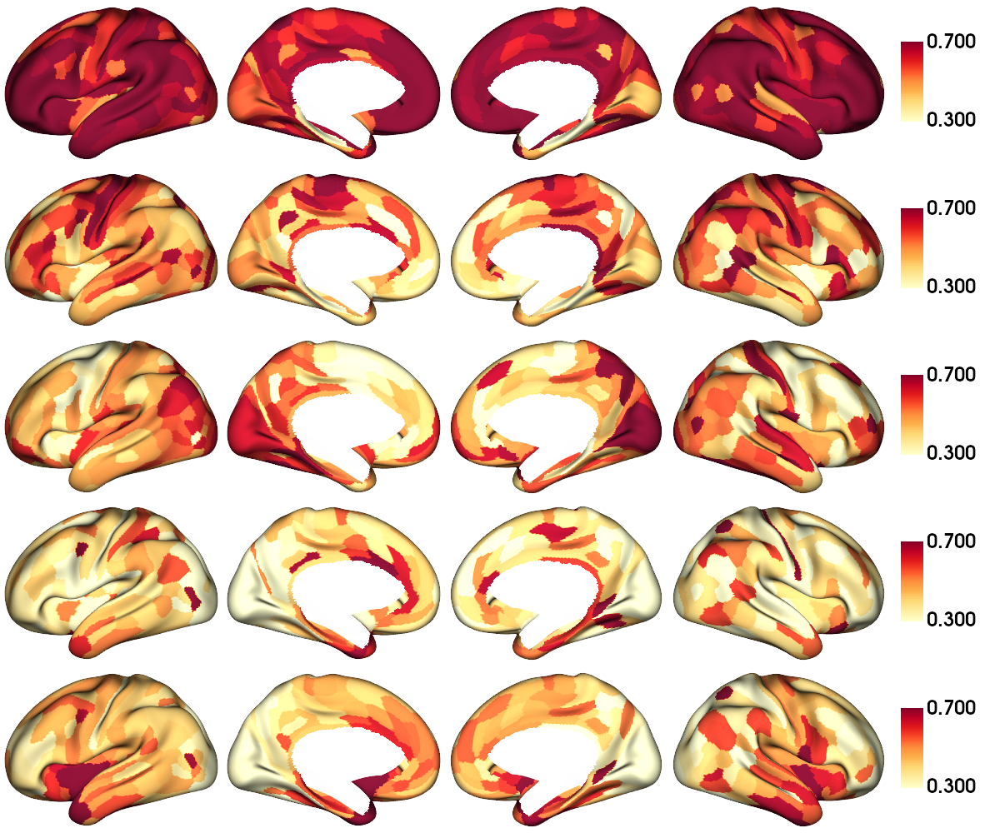

In [17]:
fp.plot_surface(data = plot[5:10], surf='fsLR', nan_color=(1,1,1,0.01),
                size = (1200, 200*5), color_range=(0.3,0.7),
                cmap = 'YlOrRd', filename = '../../figures/gene_express_2.png',
                display=True)

PearsonRResult(statistic=-0.019673674491543038, pvalue=0.7098782972209703)
PearsonRResult(statistic=-0.08314805094402543, pvalue=0.11528764334238567)
PearsonRResult(statistic=0.11685581499106992, pvalue=0.026618093819681325)
PearsonRResult(statistic=0.12954690350736833, pvalue=0.01390124842061118)
PearsonRResult(statistic=0.019237968513285457, pvalue=0.7160230335712362)
PearsonRResult(statistic=0.23223643972900002, pvalue=8.504715155431643e-06)
PearsonRResult(statistic=-0.28475721466281045, pvalue=3.8337807723036665e-08)
PearsonRResult(statistic=-0.05037169891809883, pvalue=0.3405814270406609)
PearsonRResult(statistic=0.05989740167806802, pvalue=0.25698802140315286)
PearsonRResult(statistic=0.04687275906763569, pvalue=0.3752175003834168)


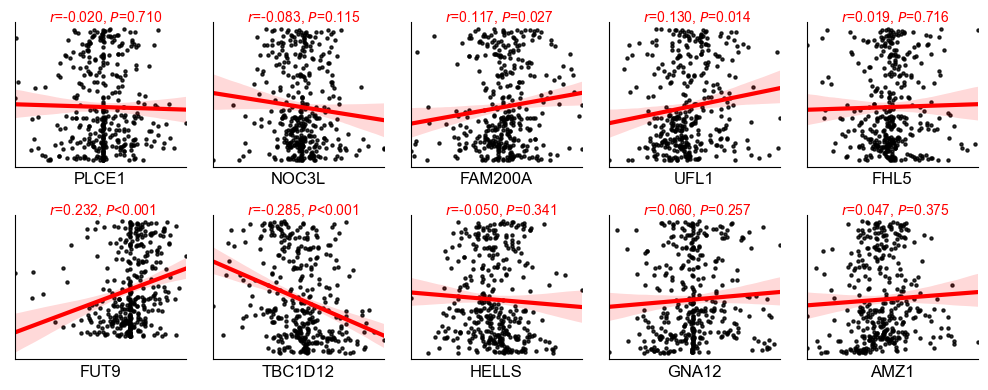

In [18]:
grad=1
name2 = [['PLCE1','NOC3L','FAM200A','UFL1','FHL5'],
         ['FUT9','TBC1D12','HELLS','GNA12','AMZ1']]
fig, ax = plt.subplots(2,5, figsize=(10,4))
for j in range(2):
  for i in range(5):
    x=df_genes[name2[j][i]].dropna()
    y=hcp_grad[:,grad-1][x.index]
    rp = ss.pearsonr(x, y)
    sns.regplot(x, y, ax = ax[j,i], 
                scatter_kws={'s': 5, 'color': 'black'},
                line_kws={'lw': 3, 'color': 'red'})
    ax[j,i].spines['right'].set_visible(False)
    ax[j,i].spines['top'].set_visible(False)
    ax[j,i].set_yticks([])
    ax[j,i].set_xticks([])
    if rp[1] > 0.001:
      ax[j,i].text(0.2, 1, '$\it{r}$=' + '%.3f'%(rp[0])+', $\it{P}$=' + '%.3f'%(rp[1]), 
                 c='red', transform=ax[j,i].transAxes)
    else:
      ax[j,i].text(0.2, 1, '$\it{r}$=' + '%.3f'%(rp[0])+', $\it{P}$<0.001', 
                 c='red', transform=ax[j,i].transAxes)  
    print(rp)

fig.tight_layout()
plt.savefig('../../figures/genes_grad_g'+str(grad)+'.png', dpi=300, transparent=True)

In [19]:
#from statsmodels.regression.linear_model import OLS
def ols(y, x=df_genes.dropna(), alpha=0, L1_wt=0.5):
    if alpha != 0:
      model=OLS(y[x.index], np.array(x)).fit_regularized(alpha=alpha, L1_wt=L1_wt)
      tt=None
    else:
      model=OLS(y[x.index], x).fit()
      std = np.array(x).std(0)
      #std[0] = 1
      tt = model.t_test(np.diag(std))
    y_pred = model.predict(np.array(x))
    rp=ss.pearsonr(y_pred,y[x.index])
    return [model, rp, tt, y_pred, y[x.index]]

In [20]:
glm = ols(hcp_grad[:,grad-1])

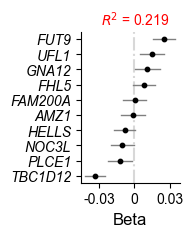

In [21]:
fig, ax = plt.subplots(1, figsize=(2,n/2-2.5))
rank=glm[2].summary_frame().coef.argsort()
for i in range(len(name)):
  ax.plot([np.array(glm[2].summary_frame()['Conf. Int. Low'])[rank][i],
           np.array(glm[2].summary_frame()['Conf. Int. Upp.'])[rank][i]],
          [i,i], lw=1, color='black',alpha=0.5)
ax.scatter(np.array(glm[2].summary_frame().coef)[rank],range(len(name)), s=10, 
           color='black', zorder=9)
ax.axvline(x=0,c='gray',ls='-.',alpha=0.3)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([-0.03,0,0.03])
ax.set_xticklabels(['-0.03','0','0.03'])
ax.set_yticks(range(n))
ax.set_yticklabels(np.array(name)[rank], style='italic')
ax.set_xlabel('Beta')

ax.text(0.2, 1.05, '$\it{R}$$^2$ = ' + '%.3f'%(glm[0].rsquared), 
        c='red', transform=ax.transAxes)

fig.tight_layout()
plt.savefig('../../figures/Beta_g'+str(grad)+'.png', dpi=300, transparent=True)

PearsonRResult(statistic=0.4677196282359051, pvalue=5.737978867786121e-21)

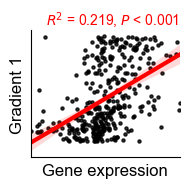

In [22]:
fig, ax = plt.subplots(1, figsize=(2,2))
sns.regplot(glm[3], glm[4], ax = ax, 
            scatter_kws={'s': 5, 'color': 'black'},
            line_kws={'lw': 3, 'color': 'red'})
ax.tick_params(axis='both', labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#ax.set_xlim(-0.6, 0.6)
#ax.set_ylim(-0.1, 0.1)
ax.set_yticks([])
ax.set_xticks([])
#ax.set_yticklabels(['-0.1', '0', '0.1'])
ax.set_xlabel('Gene expression')
ax.set_ylabel('Gradient '+str(grad))
if glm[1][1] < 0.001:
  ax.text(0.1, 1.05, '$\it{R}$$^2$ = ' + '%.3f'%(glm[0].rsquared)+', $\it{P}$ < 0.001', 
          c='red', transform=ax.transAxes)
else:
  ax.text(0.1, 1.05, '$\it{R}$$^2$ = ' + '%.3f'%(glm[0].rsquared)+', $\it{P}$ = '+'%.3f'%glm[1][1], 
          c='red', transform=ax.transAxes)
fig.tight_layout()
plt.savefig('../../figures/scatter_gene_grad_g'+str(grad)+'.png', dpi=300, transparent=True)
glm[1]

In [23]:
y=hcp_grad[:,grad-1]

if grad==3:
  x=df_genes[np.array(name)[glm[2].pvalue < 0.05]].dropna()
else:    
  x=df_genes[np.array(name)[glm[2].pvalue < 0.05]].dropna()

print(x.columns)
model_actual=OLS(y[x.index], np.array(x)).fit()
model_actual.rsquared, model_actual.rsquared_adj

Index(['PLCE1', 'NOC3L', 'UFL1', 'FUT9', 'TBC1D12', 'GNA12'], dtype='object')


(0.20644722350332045, 0.19299717644405479)

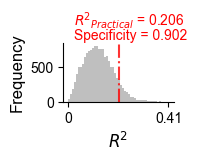

In [24]:
genes_all = np.array(allen.columns[1:],dtype=str)
num_samp=15000
performance=np.zeros((num_samp,3)) # 3 means rsquared, rsquared_adj, r
for i in range(num_samp):
  genes_select = genes_all[np.random.randint(0,len(genes_all),len(x.columns))]
  x=allen[genes_select].dropna()
  model=OLS(y[x.index], np.array(x)).fit()
  y_pred=model.predict(np.array(x))
  performance[i][0]=model.rsquared
  performance[i][1]=model.rsquared_adj
  performance[i][2]=ss.pearsonr(y[x.index], y_pred)[0]

n_less=len(performance[:,0][performance[:,0]<model_actual.rsquared])/num_samp

fig, ax = plt.subplots(1, figsize=(2,2))
ax.hist(performance[:,0],bins=50,color='grey',alpha=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([0,performance[:,0].max().round(2)])
ax.set_xticklabels(['0',str(performance[:,0].max().round(2))])
ax.set_xlabel( '$\it{R}$$^2$')
ax.set_ylabel('Frequency')
ax.axvline(x=model_actual.rsquared,c='red',ls='-.',alpha=0.8)
ax.text(0.1, 1.3, '$\it{R}$$^{2}$$_{Practical}$ = ' + '%.3f'%(model_actual.rsquared), 
        c='red', transform=ax.transAxes)
ax.text(0.1, 1.05, 'Specificity = '+'%.3f'%(n_less), 
        c='red', transform=ax.transAxes)
fig.tight_layout()
plt.savefig('../../figures/bootstrap_gene_grad_g'+str(grad)+'.png', dpi=300, transparent=True)

## ABHA data-driven

In [25]:
all_gene_corr = np.zeros((len(genes_all),2))
for i in range(len(genes_all)):
  x=allen[genes_all[i]].dropna()
  y=hcp_grad[:,grad-1][x.index]
  all_gene_corr[i] = ss.pearsonr(x,y)

In [26]:
genes_all[all_gene_corr[:,0].argsort()][:10], genes_all[all_gene_corr[:,0].argsort()][-10:]

(array(['VAV3', 'ATP2B3', 'EEPD1', 'SLC17A6', 'LAG3', 'LAMA4', 'ABTB2',
        'STARD9', 'CUX1', 'EIF2A'], dtype='<U25'),
 array(['FAM110C', 'WFDC1', 'RBP4', 'C2CD4C', 'NOV', 'GLRA3', 'TFPT',
        'XYLT1', 'HDC', 'BAIAP3'], dtype='<U25'))

In [27]:
all_gene_corr[all_gene_corr[:,0].argsort()]

array([[-5.54981838e-01,  1.80382365e-30],
       [-5.07683813e-01,  5.55814141e-25],
       [-4.87935176e-01,  6.22668615e-23],
       ...,
       [ 5.61811229e-01,  2.45131285e-31],
       [ 5.64534869e-01,  1.09163571e-31],
       [ 5.79478154e-01,  1.12562827e-33]])

In [28]:
from sklearn.linear_model import ElasticNet
from sklearn.multioutput import MultiOutputRegressor

In [29]:
def spec(y, r2, name,num_samp=15000):
  genes_all = np.array(allen.columns[1:],dtype=str)
  performance=np.zeros((num_samp,3)) # 3 means rsquared, rsquared_adj, r
  for i in range(num_samp):
    genes_select = genes_all[np.random.randint(0,len(genes_all),len(list(name)))]
    x=allen[genes_select].dropna()
    model=OLS(y[x.index], np.array(x)).fit()
    y_pred=model.predict(np.array(x))
    performance[i][0]=model.rsquared
    performance[i][1]=model.rsquared_adj
    performance[i][2]=ss.pearsonr(y[x.index], y_pred)[0]
  n_less=len(performance[:,0][performance[:,0]<r2])/num_samp
  return n_less

In [30]:
model_actual = {}
specificity = {}
names_sig = {}
names = {}
for L1 in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
  en = ElasticNet(alpha=0.0003, l1_ratio=L1)
  model = MultiOutputRegressor(en)
  x=allen[allen.columns[1:]].dropna()
  model.fit(x, hcp_grad[:,:3][x.index])
  name = allen.columns[1:][np.logical_and(model.estimators_[0].coef_ != 0, 
                                          model.estimators_[1].coef_ != 0, 
                                          model.estimators_[2].coef_ != 0)]
  np.savetxt('../../results/gene_name_L1_'+str(L1)+'.txt', list(name), fmt='%s')
  model_actual[L1]={}
  specificity[L1] = {}
  names_sig[L1]={}
  names[L1]={}
  for grad in [1,2,3]:
    y=hcp_grad[:,grad-1]
    x=allen[name].dropna()
    model_actual[L1][grad]=OLS(y[x.index], np.array(x)).fit()
    specificity[L1][grad]=spec(y=y,r2=model_actual[L1][grad].rsquared, name=name)
    names_sig[L1][grad]=x.columns[model_actual[L1][grad].pvalues < 0.05]
    names[L1][grad]=list(name)
  print(L1)

0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1


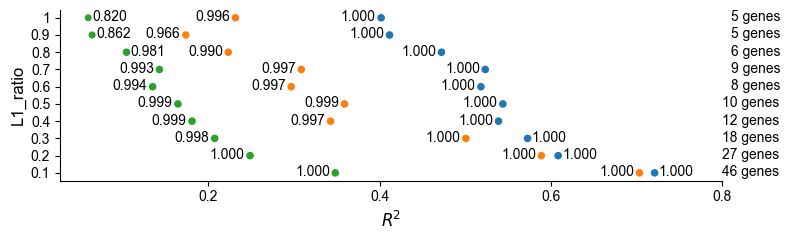

In [31]:
fig, ax = plt.subplots(figsize=(8,2.5))

ax.scatter([[k for k in model_actual.values()][i][1].rsquared for i in range(10)], np.arange(10),
           s=np.array([[k for k in specificity.values()][i][1] for i in range(10)])*20)

ax.scatter([[k for k in model_actual.values()][i][2].rsquared for i in range(10)], np.arange(10),
           s=np.array([[k for k in specificity.values()][i][2] for i in range(10)])*20)

ax.scatter([[k for k in model_actual.values()][i][3].rsquared for i in range(10)], np.arange(10),
           s=np.array([[k for k in specificity.values()][i][3] for i in range(10)])*20)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_xticks([0.2,0.4,0.6,0.8])
ax.set_yticks(range(10))
ax.set_yticklabels([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
ax.set_ylabel('L1_ratio')
ax.set_xlabel( '$\it{R}$$^2$')

for i in range(5):
  ax.text(0.8, i-0.2, str(len([[k for k in names.values()][j][1] for j in range(5)][i]))+' genes')
for i in range(5):
  ax.text(0.81, i+5-0.2, str(len([[k for k in names.values()][j+5][1] for j in range(5)][i]))+' genes')

for j in range(10):
  if j < 3:
    ax.text([[k for k in model_actual.values()][i][1].rsquared for i in range(10)][j]+0.005, j-0.2, 
          '%.3f' % [[k for k in specificity.values()][i][1] for i in range(10)][j])
  else:
    ax.text([[k for k in model_actual.values()][i][1].rsquared for i in range(10)][j]-0.047, j-0.2, 
          '%.3f' % [[k for k in specificity.values()][i][1] for i in range(10)][j])

  ax.text([[k for k in model_actual.values()][i][2].rsquared for i in range(10)][j]-0.047, j-0.2, 
          '%.3f' % [[k for k in specificity.values()][i][2] for i in range(10)][j])
  if j < 7:
    ax.text([[k for k in model_actual.values()][i][3].rsquared for i in range(10)][j]-0.047, j-0.2, 
          '%.3f' % [[k for k in specificity.values()][i][3] for i in range(10)][j])
  else:
    ax.text([[k for k in model_actual.values()][i][3].rsquared for i in range(10)][j]+0.005, j-0.2, 
          '%.3f' % [[k for k in specificity.values()][i][3] for i in range(10)][j])

fig.tight_layout()
plt.savefig('../../figures/bootstrap_L1_all.png', dpi=300, transparent=True)

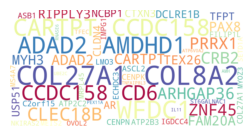

In [32]:
from wordcloud import WordCloud

text = ' '.join(np.concatenate([[k for k in names.values()][i][1] for i in range(10)]))
wc = WordCloud(background_color="white", repeat=False, colormap='Spectral_r', random_state=29,
               width=1200, height=600)
wc.generate(text)
plt.figure(figsize=(3, 2))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.savefig('../../figures/wordcloud_group_all.png', dpi=300, transparent=True)

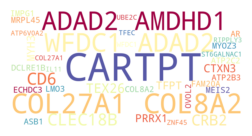

In [33]:
grad=1
text = ' '.join(np.concatenate([[k for k in names_sig.values()][i][grad] for i in range(10)]))
wc = WordCloud(background_color="white", repeat=False, colormap='Spectral_r', random_state=29,
               width=1200, height=600)
wc.generate(text)
plt.figure(figsize=(3, 2))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.savefig('../../figures/wordcloud_group_sig_g'+str(grad)+'.png', dpi=300, transparent=True)

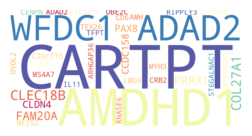

In [34]:
grad=2
text = ' '.join(np.concatenate([[k for k in names_sig.values()][i][grad] for i in range(10)]))
wc = WordCloud(background_color="white", repeat=False, colormap='Spectral_r', random_state=29,
               width=1200, height=600)
wc.generate(text)
plt.figure(figsize=(3, 2))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.savefig('../../figures/wordcloud_group_sig_g'+str(grad)+'.png', dpi=300, transparent=True)

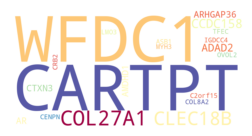

In [35]:
grad=3
text = ' '.join(np.concatenate([[k for k in names_sig.values()][i][grad] for i in range(10)]))
wc = WordCloud(background_color="white", repeat=False, colormap='Spectral_r', random_state=29,
               width=1200, height=600)
wc.generate(text)
plt.figure(figsize=(3, 2))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.savefig('../../figures/wordcloud_group_sig_g'+str(grad)+'.png', dpi=300, transparent=True)

In [36]:
'''
L1=0.6
en = ElasticNet(alpha=0.0002, l1_ratio=L1)
model = MultiOutputRegressor(en)
x=allen[allen.columns[1:]].dropna()
model.fit(x, hcp_grad[:,:3][x.index])
name = allen.columns[1:][np.logical_and(model.estimators_[0].coef_ != 0, 
               model.estimators_[1].coef_ != 0, 
               model.estimators_[2].coef_ != 0)]
'''

'\nL1=0.6\nen = ElasticNet(alpha=0.0002, l1_ratio=L1)\nmodel = MultiOutputRegressor(en)\nx=allen[allen.columns[1:]].dropna()\nmodel.fit(x, hcp_grad[:,:3][x.index])\nname = allen.columns[1:][np.logical_and(model.estimators_[0].coef_ != 0, \n               model.estimators_[1].coef_ != 0, \n               model.estimators_[2].coef_ != 0)]\n'

In [37]:
def spec_fig(grad, L1):
    name=np.loadtxt('../../results/gene_name_L1_'+str(L1)+'.txt',dtype=str)
    y=hcp_grad[:,grad-1]
    x=allen[name].dropna()
    model_actual_t=OLS(y[x.index], np.array(x)).fit()
    print(model_actual_t.rsquared, model_actual_t.rsquared_adj, x.columns[model_actual_t.pvalues < 0.05])
    model_actual_t=OLS(y[x.index], np.array(x[x.columns[model_actual_t.pvalues < 0.05]])).fit()

    genes_all = np.array(allen.columns[1:],dtype=str)
    num_samp=15000
    performance=np.zeros((num_samp,3)) # 3 means rsquared, rsquared_adj, r
    for i in range(num_samp):
        genes_select = genes_all[np.random.randint(0,len(genes_all),(model_actual_t.pvalues < 0.05).sum())]
        x=allen[genes_select].dropna()
        model=OLS(y[x.index], np.array(x)).fit()
        y_pred=model.predict(np.array(x))
        performance[i][0]=model.rsquared
        performance[i][1]=model.rsquared_adj
        performance[i][2]=ss.pearsonr(y[x.index], y_pred)[0]

    n_less=len(performance[:,0][performance[:,0]<model_actual_t.rsquared])/num_samp

    fig, ax = plt.subplots(1, figsize=(2,2))
    ax.hist(performance[:,0],bins=50,color='grey',alpha=0.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_xticks([0,performance[:,0].max().round(2)])
    ax.set_xticklabels(['0',str(performance[:,0].max().round(2))])
    ax.set_xlabel( '$\it{R}$$^2$')
    ax.set_ylabel('Frequency')
    ax.axvline(x=model_actual_t.rsquared,c='red',ls='-.',alpha=0.8)
    ax.text(0.1, 1.3, '$\it{R}$$^{2}$$_{Practical}$ = ' + '%.3f'%(model_actual_t.rsquared), 
            c='red', transform=ax.transAxes)
    ax.text(0.1, 1.05, 'Specificity = '+'%.3f'%(n_less), 
            c='red', transform=ax.transAxes)
    fig.tight_layout()
    plt.savefig('../../figures/bootstrap_L1_'+str(L1)+'_grad_g'+str(grad)+'.png', dpi=300, transparent=True)

0.543871810408943 0.5308395764206271 Index(['ADAD2', 'AMDHD1', 'CARTPT', 'CD6', 'CLEC18B', 'COL27A1', 'COL8A2',
       'UBE2C', 'WFDC1'],
      dtype='object')


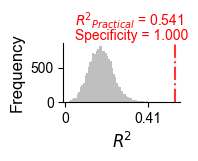

In [38]:
spec_fig(grad=1, L1=0.5)

0.3591532378500145 0.340843330360015 Index(['ADAD2', 'AMDHD1', 'CARTPT', 'CLEC18B', 'UBE2C', 'WFDC1'], dtype='object')


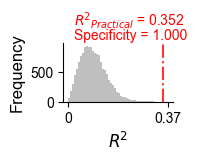

In [39]:
spec_fig(grad=2, L1=0.5)

0.1648936829771842 0.14103350249081814 Index(['AMDHD1', 'CCDC158', 'CLEC18B', 'WFDC1'], dtype='object')


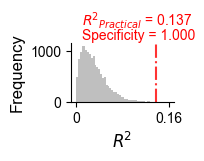

In [40]:
spec_fig(grad=3, L1=0.5)

## Heritability

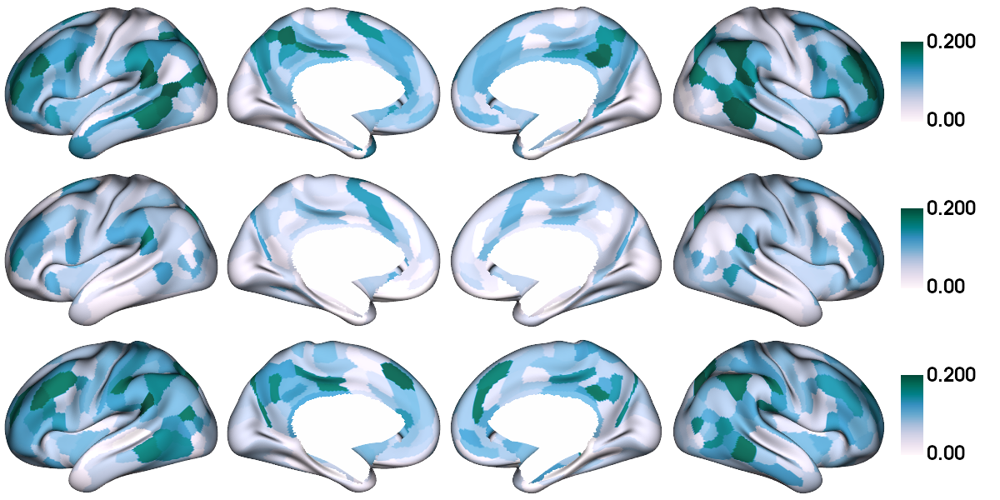

In [41]:
ukb_h2 = [pd.read_csv('../../data/region_g1_h2r.txt'),
          pd.read_csv('../../data/region_g2_h2r.txt'),
          pd.read_csv('../../data/region_g3_h2r.txt')]
data = [np.array(ukb_h2[0].H2r), np.array(ukb_h2[1].H2r), np.array(ukb_h2[2].H2r)]
plot = [None] * 3
for i in range(3):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = data[i][node]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 600), color_range=(0,0.2),
                cmap = 'PuBuGn', filename = '../../figures/H2_ukb.png',
                display=True)

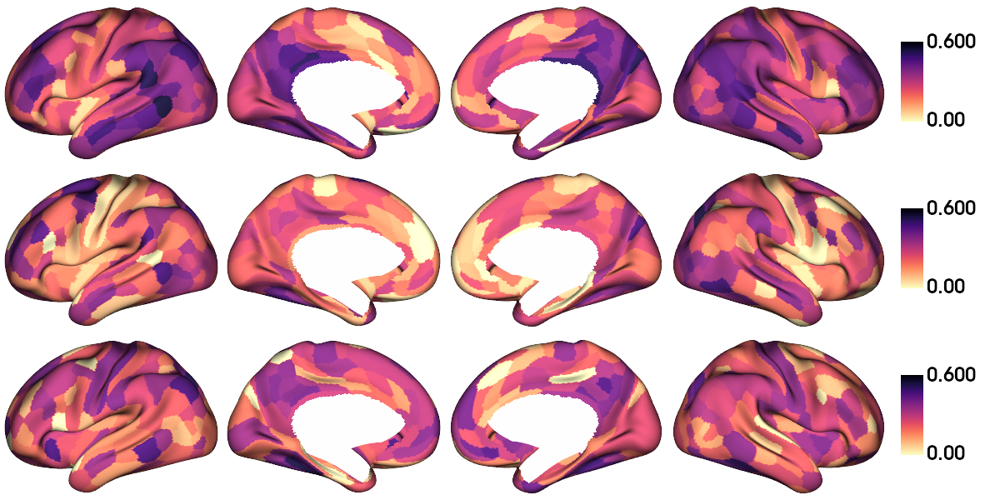

In [42]:
name = 'QTAB_ses-01'
qtab_h2 = pd.read_csv('../../data/2_herit_'+name+'.csv')
df=qtab_h2.copy()
data = [np.array(df[df.vec==1].H2r), np.array(df[df.vec==2].H2r), np.array(df[df.vec==3].H2r)]
plot = [None] * 3
for i in range(3):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = data[i][node]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 600), color_range=(0,0.6),
                cmap = 'magma_r', filename = '../../figures/H2_'+name+'.png',
                display=True)

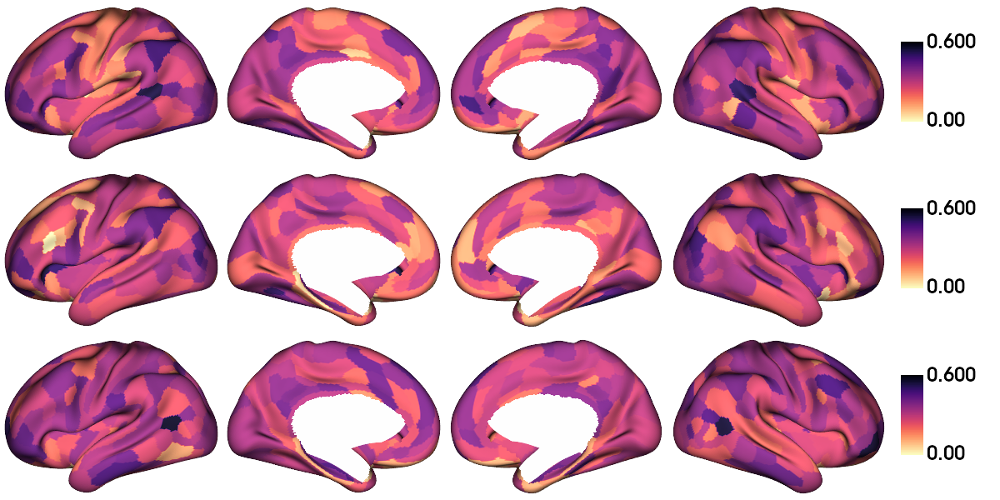

In [43]:
name = 'hcp_REST1'
hcp_h2 = pd.read_csv('../../data/2_herit_'+name+'.csv')
df=hcp_h2.copy()
data = [np.array(df[df.vec==1].H2r), np.array(df[df.vec==2].H2r), np.array(df[df.vec==3].H2r)]
plot = [None] * 3
for i in range(3):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = data[i][node]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 600), color_range=(0,0.6),
                cmap = 'magma_r', filename = '../../figures/H2_'+name+'.png',
                display=True)

In [44]:
'''
h2_=np.zeros((9,360))
for i in range(3):
  h2_[i*3]=ukb_h2[i].H2r
  h2_[i*3+1]=hcp_h2[hcp_h2.vec==i+1].H2r
  h2_[i*3+2]=qtab_h2[qtab_h2.vec==i+1].H2r

h2_r = np.zeros((3,9,9))
for i in range(1,9):
  for j in range(i):
    tmp=fp.pearson_variogram(h2_[i],h2_[j])
    h2_r[0,i,j] = tmp[0][0]
    h2_r[1,i,j] = tmp[0][1]
    h2_r[2,i,j] = tmp[1]
  print(i+1)
np.savetxt('../../results/heritability_correlation_r.txt', h2_r[0])
np.savetxt('../../results/heritability_correlation_p.txt', h2_r[1])
np.savetxt('../../results/heritability_correlation_variogram.txt', h2_r[2])
'''

"\nh2_=np.zeros((9,360))\nfor i in range(3):\n  h2_[i*3]=ukb_h2[i].H2r\n  h2_[i*3+1]=hcp_h2[hcp_h2.vec==i+1].H2r\n  h2_[i*3+2]=qtab_h2[qtab_h2.vec==i+1].H2r\n\nh2_r = np.zeros((3,9,9))\nfor i in range(1,9):\n  for j in range(i):\n    tmp=fp.pearson_variogram(h2_[i],h2_[j])\n    h2_r[0,i,j] = tmp[0][0]\n    h2_r[1,i,j] = tmp[0][1]\n    h2_r[2,i,j] = tmp[1]\n  print(i+1)\nnp.savetxt('../../results/heritability_correlation_r.txt', h2_r[0])\nnp.savetxt('../../results/heritability_correlation_p.txt', h2_r[1])\nnp.savetxt('../../results/heritability_correlation_variogram.txt', h2_r[2])\n"

In [45]:
h2_r=np.zeros((3,9,9))
h2_r[0]=np.loadtxt('../../results/heritability_correlation_r.txt')
h2_r[1]=np.loadtxt('../../results/heritability_correlation_p.txt')
h2_r[2]=np.loadtxt('../../results/heritability_correlation_variogram.txt')
h2_rr=h2_r.copy()
for n in range(3):
  for i in range(9):
    h2_rr[n,i,i+1:]=np.nan

np.fill_diagonal(h2_rr[0], 1)
np.fill_diagonal(h2_rr[2], 1)
h2_rr[2][h2_rr[2]>0.05]=np.nan
np.where(~np.isnan(h2_rr[2]))[0].shape

(18,)

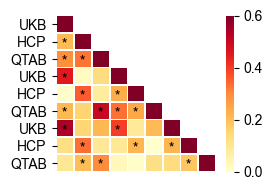

In [46]:
h2_rr[2][h2_rr[2]>0.05]=np.nan
text_pos=np.where(~np.isnan(h2_rr[2]))
fig, ax = plt.subplots(1, figsize=(2.8,2))
sns.heatmap(h2_rr[0],ax=ax,linewidths=0.5,vmin=0,vmax=0.6,cmap='YlOrRd')
for i in range(len(text_pos[0])):
  ax.text(text_pos[1][i]+0.3,text_pos[0][i]+0.9,'*')
ax.set_yticks(np.arange(9)+0.5)
ax.set_yticklabels(['UKB','HCP','QTAB'] * 3, rotation=0)
ax.set_xticks([])
fig.tight_layout()
plt.savefig('../../figures/h2r_heatmap.png', dpi=300, transparent=True)

## PGS

In [12]:
adhd = pd.read_csv('../../data/Ed_He_PGS/adhd2022_full.txt',sep='\t')
asd = pd.read_csv('../../data/Ed_He_PGS/asd2019_full.txt',sep='\t')
bp = pd.read_csv('../../data/Ed_He_PGS/bip2021_full.txt',sep='\t')
mdd = pd.read_csv('../../data/Ed_He_PGS/mdd2023_full.txt',sep='\t')
ocd = pd.read_csv('../../data/Ed_He_PGS/ocd2024_full.txt',sep='\t')
scz = pd.read_csv('../../data/Ed_He_PGS/scz2022_full.txt',sep='\t')
alz = pd.read_csv('../../data/Ed_He_PGS/alz2021_full.txt',sep='\t')
an = pd.read_csv('../../data/Ed_He_PGS/an2019_full.txt',sep='\t')
pdd = pd.read_csv('../../data/Ed_He_PGS/pd2019_full.txt',sep='\t')
ptsd = pd.read_csv('../../data/Ed_He_PGS/ptsd2024_full.txt',sep='\t')
sud = pd.read_csv('../../data/Ed_He_PGS/sud2023_full.txt',sep='\t')

func_g1 = ukb_g1.copy()
func_g2 = ukb_g2.copy()
func_g3 = ukb_g3.copy()

adhd.columns = ['FID','IID','adhd_total','adhd_norm']
asd.columns = ['FID','IID','asd_total','asd_norm']
bp.columns = ['FID','IID','bp_total','bp_norm']
mdd.columns = ['FID','IID','mdd_total','mdd_norm']
ocd.columns = ['FID','IID','ocd_total','ocd_norm']
scz.columns = ['FID','IID','scz_total','scz_norm']
alz.columns = ['FID','IID','alz_total','alz_norm']
an.columns = ['FID','IID','an_total','an_norm']
pdd.columns = ['FID','IID','pdd_total','pdd_norm']
ptsd.columns = ['FID','IID','ptsd_total','ptsd_norm']
sud.columns = ['FID','IID','sud_total','sud_norm']

cols=['IID','ADHD','ASD','BP','MDD','OCD','SCZ','ALZ','AN','PD','PTSD','SUD']
pgs = pd.DataFrame()
pgs['IID'] = func_g1.IID

pgs = pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pgs,adhd[['IID','adhd_total']],on='IID'),
                                             asd[['IID','asd_total']],on='IID'),
                                    bp[['IID','bp_total']],on='IID'),
                           mdd[['IID','mdd_total']],on='IID'),
                  ocd[['IID','ocd_total']],on='IID'),
         scz[['IID','scz_total']],on='IID')
pgs = pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pgs,alz[['IID','alz_total']],on='IID'),
                                             an[['IID','an_total']],on='IID'),
                                    pdd[['IID','pdd_total']],on='IID'),
                           ptsd[['IID','ptsd_total']],on='IID'),
                  sud[['IID','sud_total']],on='IID')

pgs.columns = cols
pgs

,IID,ADHD,ASD,BP,MDD,OCD,SCZ,ALZ,AN,PD,PTSD,SUD
0,1000028,-0.070475,1.822328,-0.491067,-0.049809,1.435706,-0.132253,0.312043,0.333792,-0.267027,-0.018457,-0.126555
1,1000118,0.313774,0.206339,-0.279142,0.141993,-0.902364,-0.771183,-0.094166,1.597292,-2.405801,-0.292761,-0.119954
2,1000133,0.311616,-0.362577,0.056498,-0.095884,-1.047878,0.526085,0.251333,0.976807,1.576910,-0.218032,0.121564
3,1000196,0.194322,0.416074,0.189708,0.269215,1.506777,-1.090669,0.180342,0.034557,1.080131,-0.039069,-0.164570
4,1000211,0.178305,0.215266,-0.145464,-0.508733,-0.200587,0.511114,0.082836,-0.313112,2.384761,-0.180891,-0.006266
...,...,...,...,...,...,...,...,...,...,...,...,...
30711,6025107,-0.621770,-1.879110,0.271986,-0.153717,-0.497718,0.471731,0.203566,-0.856077,0.689994,0.328831,0.235393
30712,6025231,0.155018,0.147499,0.230460,-0.120186,-0.142499,-0.990548,0.054489,-0.593895,-0.198332,0.169890,0.135783
30713,6025704,-0.002581,-0.503290,0.099989,0.164459,1.500452,0.272066,-0.093323,-0.532452,2.043317,-0.169420,0.112939
30714,6025771,-0.190605,-0.332809,0.119108,-0.197310,0.386212,-0.207510,0.273747,-1.688119,-0.480443,-0.488470,-0.124988


In [13]:
cov_1 = pd.read_csv('../../data/WMqcovar.txt', sep=' ')
cov_2 = pd.read_csv('../../data/WMcovardiscrete.txt', sep=' ')

In [14]:
mask = np.zeros(len(func_g1.IID))
for i in range(len(mask)):
    if func_g1.IID[i] in np.array(pgs.IID):
        mask[i] = 1

In [15]:
mask = np.zeros(len(func_g1.IID))
for i in range(len(mask)):
    if func_g1.IID[i] in np.array(pgs.IID):
        mask[i] = 1
func_g1 = func_g1[mask==1].reset_index(drop=True)
func_g2 = func_g2[mask==1].reset_index(drop=True)
func_g3 = func_g3[mask==1].reset_index(drop=True)
mask = np.zeros(len(pgs.IID))
for i in range(len(mask)):
    if pgs.IID[i] in np.array(func_g1.IID):
        mask[i] = 1
pgs = pgs[mask==1].reset_index(drop=True)
mask = np.zeros(len(func_g1.IID))
for i in range(len(mask)):
    if func_g1.IID[i] in np.array(cov_1.IID):
        mask[i] = 1
pgs = pgs[mask==1].reset_index(drop=True)
func_g1 = func_g1[mask==1].reset_index(drop=True)
func_g2 = func_g2[mask==1].reset_index(drop=True)
func_g3 = func_g3[mask==1].reset_index(drop=True)
mask = np.zeros(len(cov_1.IID))
for i in range(len(mask)):
    if cov_1.IID[i] in np.array(func_g1.IID):
        mask[i] = 1
cov_1 = cov_1[mask==1].reset_index(drop=True)
cov_2 = cov_2[mask==1].reset_index(drop=True)

In [16]:
mask = np.zeros(len(ed.IID))
for i in range(len(mask)):
    if ed.IID[i] in np.array(pgs.IID):
        mask[i] = 1
ed = ed[mask==1].reset_index(drop=True)
ed

,FID,IID,g1,g2,g3,g4,g5,g6,g7,g8,...,node_351,node_352,node_353,node_354,node_355,node_356,node_357,node_358,node_359,node_360
0,1000028,1000028,0.999798,1.032330,0.840154,0.651594,0.546685,0.426289,0.376287,0.312595,...,0.144622,0.070540,0.129985,0.167879,0.150803,0.045927,0.149370,0.075103,0.141567,0.134906
1,1000118,1000118,1.148016,0.931020,0.847642,0.607487,0.525079,0.488918,0.383643,0.365865,...,0.096429,0.061335,0.114347,0.106815,0.156108,0.105728,0.154427,0.010687,0.054400,0.111906
2,1000133,1000133,0.883587,0.813765,0.829801,0.662422,0.503710,0.401402,0.412069,0.335929,...,0.068734,0.066502,0.137876,0.082269,0.136942,0.058560,0.147622,0.014146,0.069894,0.135001
3,1000196,1000196,1.063798,1.124435,0.839977,0.547980,0.468881,0.457262,0.376820,0.294137,...,0.084865,0.047728,0.097617,0.145761,0.134559,0.096958,0.136630,0.104957,0.083150,0.120660
4,1000211,1000211,1.039952,1.019113,0.937809,0.634310,0.558142,0.437007,0.521302,0.344193,...,0.115469,0.016985,0.168562,0.177199,0.172927,0.080145,0.119734,0.109922,0.053114,0.108993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30711,6025107,6025107,1.135595,1.003885,0.916639,0.570967,0.587305,0.452680,0.561302,0.353127,...,0.106444,0.051741,0.031548,0.163736,0.157227,0.151834,0.174560,0.094482,0.062608,0.124898
30712,6025231,6025231,0.960788,0.849651,0.875075,0.559568,0.511900,0.511780,0.423313,0.473676,...,0.072897,0.059667,0.027442,0.120087,0.096691,0.119771,0.075084,0.040902,0.061490,0.042113
30713,6025704,6025704,1.014749,1.008798,0.890948,0.587976,0.520119,0.492429,0.425981,0.366955,...,0.099218,0.113266,0.170952,0.140211,0.174500,0.084760,0.119769,0.165387,0.111219,0.087427
30714,6025771,6025771,1.108719,1.137361,1.031133,0.621157,0.614805,0.522221,0.428952,0.362496,...,0.109579,0.054785,0.118254,0.110137,0.117810,0.081011,0.077038,0.079261,0.098290,0.106688


In [17]:
cov=np.concatenate((cov_2[cov_2.columns[2:]],cov_1[cov_1.columns[2:46]]),axis=1)
for i in range(360):
  # g1
  model=OLS(func_g1['node_'+str(i+1)], cov).fit()
  pred = model.predict(cov)
  func_g1['node_'+str(i+1)] = func_g1['node_'+str(i+1)] - pred
  # g2
  model=OLS(func_g2['node_'+str(i+1)], cov).fit()
  pred = model.predict(cov)
  func_g2['node_'+str(i+1)] = func_g2['node_'+str(i+1)] - pred
  # g3
  model=OLS(func_g3['node_'+str(i+1)], cov).fit()
  pred = model.predict(cov)
  func_g3['node_'+str(i+1)] = func_g3['node_'+str(i+1)] - pred
  # distance
  model=OLS(ed['node_'+str(i+1)], cov).fit()
  pred = model.predict(cov)
  ed['node_'+str(i+1)] = ed['node_'+str(i+1)] - pred
func_g1

,FID,IID,r_HCP,node_1,node_2,node_3,node_4,node_5,node_6,node_7,...,node_351,node_352,node_353,node_354,node_355,node_356,node_357,node_358,node_359,node_360
0,1000028,1000028,0.857720,-0.048136,-0.047090,-0.038135,-0.026300,-0.023327,-0.021118,-0.040410,...,-0.064818,0.035634,-0.008708,-0.006129,0.002423,-0.062311,0.036764,-0.007784,0.089972,0.070168
1,1000118,1000118,0.814104,-0.067532,0.065252,-0.068934,-0.056840,-0.047395,-0.042332,-0.056774,...,-0.029851,-0.032076,-0.037874,-0.001861,-0.003256,0.047150,0.039014,0.018703,-0.006297,0.061189
2,1000133,1000133,0.877132,-0.013583,-0.012369,-0.028330,-0.001345,0.002004,-0.002929,0.028655,...,-0.017238,-0.041414,-0.019181,0.000278,-0.004945,-0.022813,0.040180,0.018004,0.022888,0.065755
3,1000196,1000196,0.811406,-0.045918,0.052767,-0.054020,-0.043522,-0.043956,-0.036276,-0.032804,...,0.018534,-0.030800,0.037772,0.046686,0.056425,0.004655,0.023476,0.023190,-0.006468,-0.032089
4,1000211,1000211,0.797956,-0.061904,0.050462,-0.065707,-0.039391,-0.043182,-0.038069,-0.050376,...,-0.036517,-0.014237,-0.016773,-0.009776,-0.007646,0.022194,0.017656,-0.013801,-0.030851,-0.083377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30711,6025107,6025107,0.780301,-0.013329,-0.030107,0.100870,-0.001806,0.009677,0.007337,0.009585,...,0.049648,0.014558,0.001473,-0.058413,-0.060672,0.073452,0.052542,-0.052837,-0.004755,0.070176
30712,6025231,6025231,0.839651,-0.025641,0.148947,-0.041327,-0.027246,-0.020636,-0.017815,-0.033046,...,-0.022691,0.002622,0.025699,-0.002158,0.000061,0.070829,-0.025732,-0.015245,-0.026789,-0.064057
30713,6025704,6025704,0.835467,0.051221,0.016832,0.000423,0.040889,0.024808,0.016263,-0.012469,...,0.054509,-0.045072,-0.026601,-0.011895,-0.014082,-0.032743,-0.109971,-0.038155,-0.048494,0.016156
30714,6025771,6025771,0.796113,-0.025479,-0.010314,-0.033532,-0.013972,-0.008892,0.000311,-0.013933,...,-0.004969,-0.065712,0.050334,0.041732,0.067396,-0.031779,-0.035985,-0.006227,0.000292,-0.003369


In [18]:
[ss.pearsonr(cov_1.Age,func_g1.r_HCP), ss.pearsonr(cov_1.Age,func_g2.r_HCP),ss.pearsonr(cov_1.Age,func_g3.r_HCP),
 ss.pearsonr(cov_2.Sex,func_g1.r_HCP), ss.pearsonr(cov_2.Sex,func_g2.r_HCP),ss.pearsonr(cov_2.Sex,func_g3.r_HCP)]

[PearsonRResult(statistic=-0.1514462570874018, pvalue=5.312725326948407e-157),
 PearsonRResult(statistic=-0.14229927754638894, pvalue=1.1690994147855775e-138),
 PearsonRResult(statistic=-0.10737969199914899, pvalue=1.895910913728551e-79),
 PearsonRResult(statistic=-0.16577838475181383, pvalue=3.79475173654751e-188),
 PearsonRResult(statistic=-0.01425109999073099, pvalue=0.012501243251353345),
 PearsonRResult(statistic=-0.16870508365506648, pvalue=7.157583640115002e-195)]

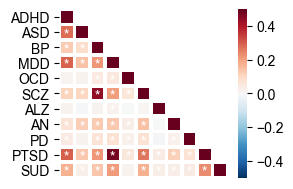

In [19]:
data_tmp = np.array(pgs.drop(['IID'],axis=1)).T
corr_matrix= np.zeros((2,11,11))
for i in range(11):
  for j in range(11):
    corr_matrix[0,i,j] = ss.pearsonr(data_tmp[i], data_tmp[j])[0]
    corr_matrix[1,i,j] = ss.pearsonr(data_tmp[i], data_tmp[j])[1]
corr_matrix[0] *= np.tri(*corr_matrix[0].shape)
corr_matrix[1] *= np.tri(*corr_matrix[1].shape, -1)
np.savetxt('../../results/PGS_intercorrelation_r.txt', corr_matrix[0])
np.savetxt('../../results/PGS_intercorrelation_p.txt', corr_matrix[1])

corr_matrix[0][corr_matrix[0]==0] = np.nan
corr_matrix[1][np.tri(*corr_matrix[1].shape, -1)==0] = np.nan
corr_matrix[1][corr_matrix[1]>0.001]=np.nan
text_pos=np.where(~np.isnan(corr_matrix[1]))

fig, ax = plt.subplots(1, figsize=(3,2))
sns.heatmap(corr_matrix[0][:11,:11], vmax=0.5, vmin=-0.5, cmap='RdBu_r', linewidths=2)
ax.set_xticks([])
labels=cols[1:].copy()
#ax.set_xticklabels(labels, rotation = 60)
ax.set_yticks(np.arange(0.5,11.5))
ax.set_yticklabels(labels,rotation = 0)

for i in range(len(text_pos[0])):
  ax.text(text_pos[1][i]+0.3,text_pos[0][i]+0.9,'*',color='white')

fig.tight_layout()
plt.savefig('../../figures/PGS_corr.png', dpi=300, transparent=True)

## Metabolism

In [20]:
timep='1st' # or Rep
if timep == '1st':
  time_p = '-0.0'
else:
  time_p = '-1.0'
metabolites = pd.read_csv('/data/p_02378/UKB_cam/project/ukb_metabolite.csv')
meta_name = pd.read_csv('../../../SCZ_ENIGMA/data/ukb/Nightingale_biomarker_groups.txt', sep = '	')
meta_name=meta_name.sort_values(by='Group').reset_index(drop=True)
meta_id1 = list(meta_name['field_id'].astype(str) + '-0.0')
meta_id2 = list(meta_name['field_id'].astype(str) + '-1.0')
metabolites1 = metabolites[['eid'] + meta_id1 + ['Age'+timep+'Visit','AgeAtScan']]
metabolites2 = metabolites[['eid'] + meta_id2 + ['Age'+timep+'Visit','AgeAtScan']]
metabolites1['cov_0'] = (metabolites1['AgeAtScan'] - metabolites1['Age'+timep+'Visit'])/metabolites1['AgeAtScan']
metabolites1.columns = ['IID'] + meta_id1 + ['Age'+timep+'Visit','AgeAtScan','cov_0']
metabolites2['cov_0'] = (metabolites2['AgeAtScan'] - metabolites2['Age'+timep+'Visit'])/metabolites2['AgeAtScan']
metabolites2.columns = ['IID'] + meta_id2 + ['Age'+timep+'Visit','AgeAtScan','cov_0']

for i in meta_id1:
  mean = np.nanmean(metabolites1[i])
  std = np.nanstd(metabolites1[i])
  metabolites1.loc[(metabolites1[i] > mean + 3 * std) | (metabolites1[i] < mean - 3 * std), i] = np.nan

for i in meta_id2:
  mean = np.nanmean(metabolites2[i])
  std = np.nanstd(metabolites2[i])
  metabolites2.loc[(metabolites2[i] > mean + 3 * std) | (metabolites2[i] < mean - 3 * std), i] = np.nan

metabolites1 = metabolites1.loc[~np.isnan(metabolites1['cov_0'])].reset_index(drop=True)
metabolites2 = metabolites2.loc[~np.isnan(metabolites2['cov_0'])].reset_index(drop=True)

In [21]:
import pingouin as pg

In [22]:
icc = [None] * len(meta_id1)
for i in range(len(meta_id1)):
    df_tmp = pd.DataFrame()
    df_tmp['subject'] = np.concatenate((metabolites1['IID'],metabolites2['IID']))
    df_tmp['rater'] = np.concatenate((np.zeros(len(metabolites1)),np.ones(len(metabolites2))))
    df_tmp['score'] = np.concatenate((metabolites1[meta_id1[i]],metabolites2[meta_id2[i]]))
    icc[i] = pg.intraclass_corr(data=df_tmp, targets='subject', raters='rater', ratings='score', nan_policy='omit')

meta_name_t = meta_name.copy()
meta_name_t['ICC'] = np.array([icc[i].ICC[2] for i in range(len(icc))])
meta_name_t['F'] = np.array([icc[i].F[2] for i in range(len(icc))])
meta_name_t['df1'] = np.array([icc[i].df1[2] for i in range(len(icc))])
meta_name_t['df2'] = np.array([icc[i].df2[2] for i in range(len(icc))])
meta_name_t['P'] = np.array([icc[i].pval[2] for i in range(len(icc))])
meta_name_t['CI95%_lower'] = np.array([icc[i]['CI95%'][2][0] for i in range(len(icc))])
meta_name_t['CI95%_upper'] = np.array([icc[i]['CI95%'][2][1] for i in range(len(icc))])
meta_name_t.to_csv('../../results/metabolites_ICC.csv',index=None, sep='\t')

KeyboardInterrupt: 

In [ ]:
icc3 = np.array([icc[i].ICC[2] for i in range(len(icc))])
meta_name.loc[icc3>0.7]

,field_id,title,Group,Subgroup
20,23406,HDL cholesterol,Cholesterol,NaN
24,23418,Cholesteryl esters in HDL,Cholesteryl esters,NaN
48,23422,Free cholesterol in HDL,Free cholesterol,NaN
63,23431,Average diameter for VLDL particles,Lipoprotein particle sizes,NaN
65,23433,Average diameter for HDL particles,Lipoprotein particle sizes,NaN
93,23556,Free cholesterol in very large HDL,Lipoprotein subclasses,Very large HDL (average diameter 14.3 nm)
94,23552,Total lipids in very large HDL,Lipoprotein subclasses,Very large HDL (average diameter 14.3 nm)
103,23563,Free cholesterol in large HDL,Lipoprotein subclasses,Large HDL (average diameter 12.1 nm)
106,23551,Concentration of very large HDL particles,Lipoprotein subclasses,Very large HDL (average diameter 14.3 nm)
109,23562,Cholesteryl esters in large HDL,Lipoprotein subclasses,Large HDL (average diameter 12.1 nm)


In [172]:
def pearson_na(x,y):
  import numpy.ma as ma
  a=ma.masked_invalid(x)
  b=ma.masked_invalid(y)
  msk = (~a.mask & ~b.mask)
  rp = ss.pearsonr(a[msk],b[msk])
  return np.append(rp,(msk).sum())

In [191]:
cov_nogen=np.concatenate((pd.get_dummies(cov_2[['Scan.Site', 'Sex']],columns=['Scan.Site','Sex']),
                          cov_1[['Age','Agesquared','Age_Sex','Agesquared_sex',
                          'eulerleftplusright','fd','fd_max']]),axis=1)

pgs_cov = pgs.copy()
for i in range(cov_nogen.shape[1]):
    pgs_cov['cov_'+str(i+1)] = cov_nogen[:,i]

meta_id_filter = list(meta_name['field_id'][icc3>0.7].astype(str)+ '-0.0') 
df_meta = pd.merge(pgs_cov,metabolites1[['IID'] + meta_id_filter +['cov_0']], on='IID')

df_g1 = pd.merge(df_meta,ukb_g1, on='IID')
df_g2 = pd.merge(df_meta,ukb_g2, on='IID')
df_g3 = pd.merge(df_meta,ukb_g3, on='IID')

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.r_HCP, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.r_HCP, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.r_HCP, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forsimilarityr_raw-1st.csv',index=None, sep='\t')

In [192]:
model=OLS(df_g1['r_HCP'], df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g1['r_HCP'] = df_g1['r_HCP'] - pred

model=OLS(df_g2['r_HCP'], df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g2['r_HCP'] = df_g2['r_HCP'] - pred

model=OLS(df_g3['r_HCP'], df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g3['r_HCP'] = df_g3['r_HCP'] - pred

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.r_HCP, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.r_HCP, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.r_HCP, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forsimilarityr_cov-1st.csv',index=None, sep='\t')

In [193]:
# for rep, change meta-name to 1.0, metabolites2
meta_id_filter = list(meta_name['field_id'][icc3>0.7].astype(str)+ '-1.0') 
df_meta = pd.merge(pgs_cov,metabolites2[['IID'] + meta_id_filter+['cov_0']], on='IID')

df_g1 = pd.merge(df_meta,ukb_g1, on='IID')
df_g2 = pd.merge(df_meta,ukb_g2, on='IID')
df_g3 = pd.merge(df_meta,ukb_g3, on='IID')

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.r_HCP, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.r_HCP, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.r_HCP, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forsimilarityr_raw-Rep.csv',index=None, sep='\t')

In [194]:
model=OLS(df_g1['r_HCP'], df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g1['r_HCP'] = df_g1['r_HCP'] - pred

model=OLS(df_g2['r_HCP'], df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g2['r_HCP'] = df_g2['r_HCP'] - pred

model=OLS(df_g3['r_HCP'], df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g3['r_HCP'] = df_g3['r_HCP'] - pred

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.r_HCP, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.r_HCP, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.r_HCP, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forsimilarityr_cov-Rep.csv',index=None, sep='\t')

In [195]:
r_raw_rep = pd.read_csv('../../results/metabolism_corr_forsimilarityr_raw-Rep.csv', sep='\t')
r_raw_1st = pd.read_csv('../../results/metabolism_corr_forsimilarityr_raw-1st.csv', sep='\t')

for i in range(3):
    print(ss.pearsonr(r_raw_rep['g'+str(i+1)+'_r'], r_raw_1st['g'+str(i+1)+'_r']))

PearsonRResult(statistic=0.9819287587047478, pvalue=3.940108741741571e-18)
PearsonRResult(statistic=0.3892137226196786, pvalue=0.054473978048194725)
PearsonRResult(statistic=0.9837194756982047, pvalue=1.1970634270313366e-18)


In [196]:
r_cov_rep = pd.read_csv('../../results/metabolism_corr_forsimilarityr_cov-Rep.csv', sep='\t')
r_cov_1st = pd.read_csv('../../results/metabolism_corr_forsimilarityr_cov-1st.csv', sep='\t')

for i in range(3):
    print(ss.pearsonr(r_cov_rep['g'+str(i+1)+'_r'], r_cov_1st['g'+str(i+1)+'_r']))

PearsonRResult(statistic=0.8820134125143018, pvalue=5.627080101867614e-09)
PearsonRResult(statistic=0.31032756266505596, pvalue=0.13110516451059034)
PearsonRResult(statistic=0.984602685165676, pvalue=6.330142778000174e-19)


In [197]:
meta_group_uni = np.unique(meta_name_t['Group'])
num_group = np.arange(len(meta_name_t['Group']))

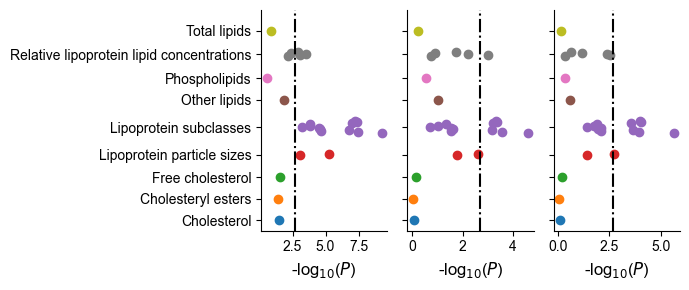

In [198]:
fig, ax = plt.subplots(1,3,figsize=(7,3))

i=0

x_tick=[]
for cat in meta_group_uni:
  y=num_group[meta_name_t['Group']==cat]+i*20
  x=-np.log10(r_cov_1st['g1_p'])[meta_name_t['Group']==cat]
  ax[0].scatter(x,y,label=cat)
  x=-np.log10(r_cov_1st['g2_p'])[meta_name_t['Group']==cat]
  ax[1].scatter(x,y,label=cat)
  x=-np.log10(r_cov_1st['g3_p'])[meta_name_t['Group']==cat]
  ax[2].scatter(x,y,label=cat)

  x_tick.append(y.mean())
  i=i+1

ax[0].set_yticks(np.array(x_tick))
ax[0].set_yticklabels(meta_group_uni, rotation=0)
ax[1].set_yticks(np.array(x_tick))
ax[1].set_yticklabels('')
ax[2].set_yticks(np.array(x_tick))
ax[2].set_yticklabels('')
for i in range(3):
  ax[i].set_ylim(-10,x_tick[-1]+20)
  ax[i].vlines(x=-np.log10(0.05/len(num_group)),ymin=-10,ymax=x_tick[-1]+20,
               color='black', ls='-.')

  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)

  ax[i].set_xlabel('-log$_{10}$($\it{P}$)')

fig.tight_layout()
plt.savefig('../../figures/metabolic_corr_pearosnr_cov-1st.png', dpi=300, transparent=True)

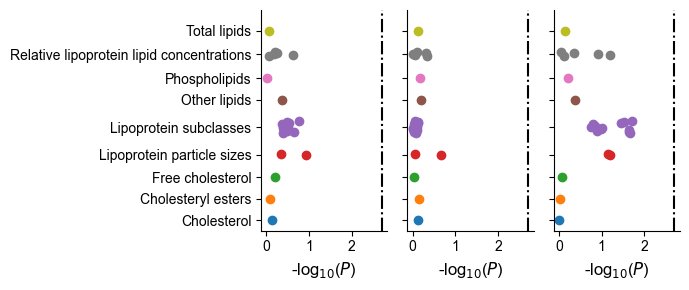

In [199]:
fig, ax = plt.subplots(1,3,figsize=(7,3))

i=0

x_tick=[]
for cat in meta_group_uni:
  y=num_group[meta_name_t['Group']==cat]+i*20
  x=-np.log10(r_cov_rep['g1_p'])[meta_name_t['Group']==cat]
  ax[0].scatter(x,y,label=cat)
  x=-np.log10(r_cov_rep['g2_p'])[meta_name_t['Group']==cat]
  ax[1].scatter(x,y,label=cat)
  x=-np.log10(r_cov_rep['g3_p'])[meta_name_t['Group']==cat]
  ax[2].scatter(x,y,label=cat)

  x_tick.append(y.mean())
  i=i+1

ax[0].set_yticks(np.array(x_tick))
ax[0].set_yticklabels(meta_group_uni, rotation=0)
ax[1].set_yticks(np.array(x_tick))
ax[1].set_yticklabels('')
ax[2].set_yticks(np.array(x_tick))
ax[2].set_yticklabels('')
for i in range(3):
  ax[i].set_ylim(-10,x_tick[-1]+20)
  ax[i].vlines(x=-np.log10(0.05/len(num_group)),ymin=-10,ymax=x_tick[-1]+20,
               color='black', ls='-.')

  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)

  ax[i].set_xlabel('-log$_{10}$($\it{P}$)')

fig.tight_layout()
plt.savefig('../../figures/metabolic_corr_pearosnr_cov-rep.png', dpi=300, transparent=True)

In [200]:
meta_id_filter = list(meta_name['field_id'][icc3>0.7].astype(str)+ '-0.0') 
df_meta = pd.merge(pgs_cov,metabolites1[['IID'] + meta_id_filter +['cov_0']], on='IID')

df_g1 = pd.merge(df_meta,ukb_g1, on='IID')
df_g1 = pd.merge(df_g1,ed[['IID','g1']], on='IID')
df_g2 = pd.merge(df_meta,ukb_g2, on='IID')
df_g2 = pd.merge(df_g2,ed[['IID','g2']], on='IID')
df_g3 = pd.merge(df_meta,ukb_g3, on='IID')
df_g3 = pd.merge(df_g3,ed[['IID','g3']], on='IID')

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.g1, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.g2, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.g3, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forElucDis_raw-1st.csv',index=None, sep='\t')

In [201]:
model=OLS(df_g1['g1'], df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g1['g1'] = df_g1['g1'] - pred

model=OLS(df_g2['g2'], df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g2['g2'] = df_g2['g2'] - pred

model=OLS(df_g3['g3'], df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g3['g3'] = df_g3['g3'] - pred

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.g1, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.g2, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.g3, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forElucDis_cov-1st.csv',index=None, sep='\t')

In [202]:
## replication 
meta_id_filter = list(meta_name['field_id'][icc3>0.7].astype(str)+ '-1.0') 
df_meta = pd.merge(pgs_cov,metabolites2[['IID'] + meta_id_filter +['cov_0']], on='IID')

df_g1 = pd.merge(df_meta,ukb_g1, on='IID')
df_g1 = pd.merge(df_g1,ed[['IID','g1']], on='IID')
df_g2 = pd.merge(df_meta,ukb_g2, on='IID')
df_g2 = pd.merge(df_g2,ed[['IID','g2']], on='IID')
df_g3 = pd.merge(df_meta,ukb_g3, on='IID')
df_g3 = pd.merge(df_g3,ed[['IID','g3']], on='IID')

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.g1, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.g2, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.g3, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forElucDis_raw-Rep.csv',index=None, sep='\t')

In [203]:
model=OLS(df_g1['g1'], df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g1[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g1['g1'] = df_g1['g1'] - pred

model=OLS(df_g2['g2'], df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g2[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g2['g2'] = df_g2['g2'] - pred

model=OLS(df_g3['g3'], df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]]).fit()
pred = model.predict(df_g3[['cov_' + str(i) for i in range(cov_nogen.shape[1]+1)]])
df_g3['g3'] = df_g3['g3'] - pred

corr_g1 = np.zeros((3,len(meta_id_filter)))
corr_g2 = np.zeros((3,len(meta_id_filter)))
corr_g3 = np.zeros((3,len(meta_id_filter)))
for i in range(len(meta_id_filter)):
    corr_g1[:,i] = pearson_na(df_g1.g1, df_g1[meta_id_filter[i]])
    corr_g2[:,i] = pearson_na(df_g2.g2, df_g2[meta_id_filter[i]])
    corr_g3[:,i] = pearson_na(df_g3.g3, df_g3[meta_id_filter[i]])
meta_name_t = meta_name.loc[icc3>0.7].reset_index(drop=True)
meta_name_t['N'] = corr_g1[2]
meta_name_t['g1_r'] = corr_g1[0]
meta_name_t['g1_p'] = corr_g1[1]
meta_name_t['g2_r'] = corr_g2[0]
meta_name_t['g2_p'] = corr_g2[1]
meta_name_t['g3_r'] = corr_g3[0]
meta_name_t['g3_p'] = corr_g3[1]
meta_name_t.to_csv('../../results/metabolism_corr_forElucDis_cov-Rep.csv',index=None, sep='\t')

In [204]:
r_raw_rep = pd.read_csv('../../results/metabolism_corr_forElucDis_raw-Rep.csv', sep='\t')
r_raw_1st = pd.read_csv('../../results/metabolism_corr_forElucDis_raw-1st.csv', sep='\t')

for i in range(3):
    print(ss.pearsonr(r_raw_rep['g'+str(i+1)+'_r'], r_raw_1st['g'+str(i+1)+'_r']))

PearsonRResult(statistic=0.9820834160660222, pvalue=3.571973545537945e-18)
PearsonRResult(statistic=0.8934572008984536, pvalue=1.8448265793567858e-09)
PearsonRResult(statistic=0.9742516841520706, pvalue=2.22587346656971e-16)


In [205]:
r_cov_rep = pd.read_csv('../../results/metabolism_corr_forElucDis_cov-Rep.csv', sep='\t')
r_cov_1st = pd.read_csv('../../results/metabolism_corr_forElucDis_cov-1st.csv', sep='\t')

for i in range(3):
    print(ss.pearsonr(r_cov_rep['g'+str(i+1)+'_r'], r_cov_1st['g'+str(i+1)+'_r']))

PearsonRResult(statistic=0.8978363911597853, pvalue=1.1639973734979237e-09)
PearsonRResult(statistic=0.12356819167176267, pvalue=0.5562152100046663)
PearsonRResult(statistic=0.9749997504578498, pvalue=1.5916055437821826e-16)


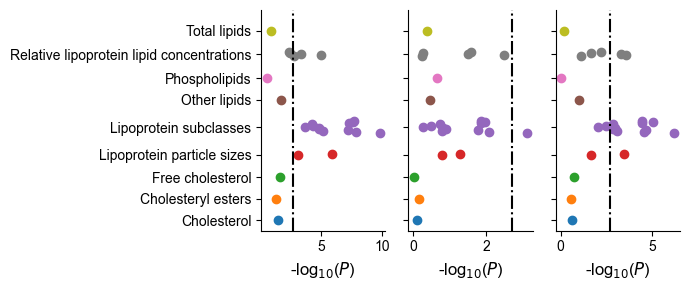

In [206]:
fig, ax = plt.subplots(1,3,figsize=(7,3))

i=0

x_tick=[]
for cat in meta_group_uni:
  y=num_group[meta_name_t['Group']==cat]+i*20
  x=-np.log10(r_cov_1st['g1_p'])[meta_name_t['Group']==cat]
  ax[0].scatter(x,y,label=cat)
  x=-np.log10(r_cov_1st['g2_p'])[meta_name_t['Group']==cat]
  ax[1].scatter(x,y,label=cat)
  x=-np.log10(r_cov_1st['g3_p'])[meta_name_t['Group']==cat]
  ax[2].scatter(x,y,label=cat)

  x_tick.append(y.mean())
  i=i+1

ax[0].set_yticks(np.array(x_tick))
ax[0].set_yticklabels(meta_group_uni, rotation=0)
ax[1].set_yticks(np.array(x_tick))
ax[1].set_yticklabels('')
ax[2].set_yticks(np.array(x_tick))
ax[2].set_yticklabels('')
for i in range(3):
  ax[i].set_ylim(-10,x_tick[-1]+20)
  ax[i].vlines(x=-np.log10(0.05/len(num_group)),ymin=-10,ymax=x_tick[-1]+20,
               color='black', ls='-.')

  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)

  ax[i].set_xlabel('-log$_{10}$($\it{P}$)')

fig.tight_layout()
plt.savefig('../../figures/metabolic_corr_ElucDis_cov-1st.png', dpi=300, transparent=True)

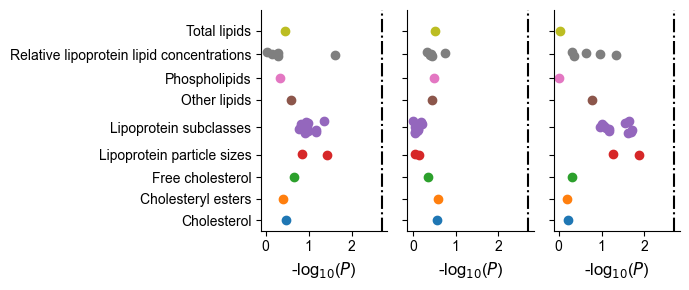

In [207]:
fig, ax = plt.subplots(1,3,figsize=(7,3))

i=0

x_tick=[]
for cat in meta_group_uni:
  y=num_group[meta_name_t['Group']==cat]+i*20
  x=-np.log10(r_cov_rep['g1_p'])[meta_name_t['Group']==cat]
  ax[0].scatter(x,y,label=cat)
  x=-np.log10(r_cov_rep['g2_p'])[meta_name_t['Group']==cat]
  ax[1].scatter(x,y,label=cat)
  x=-np.log10(r_cov_rep['g3_p'])[meta_name_t['Group']==cat]
  ax[2].scatter(x,y,label=cat)

  x_tick.append(y.mean())
  i=i+1

ax[0].set_yticks(np.array(x_tick))
ax[0].set_yticklabels(meta_group_uni, rotation=0)
ax[1].set_yticks(np.array(x_tick))
ax[1].set_yticklabels('')
ax[2].set_yticks(np.array(x_tick))
ax[2].set_yticklabels('')
for i in range(3):
  ax[i].set_ylim(-10,x_tick[-1]+20)
  ax[i].vlines(x=-np.log10(0.05/len(num_group)),ymin=-10,ymax=x_tick[-1]+20,
               color='black', ls='-.')

  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)

  ax[i].set_xlabel('-log$_{10}$($\it{P}$)')

fig.tight_layout()
plt.savefig('../../figures/metabolic_corr_ElucDis_cov-Rep.png', dpi=300, transparent=True)

## PLS MachineLearning

In [23]:
split=[None] * 100

for i in range(100):
  np.random.seed(i)
  split[i] = np.random.randint(2,size=func_g1.shape[0])

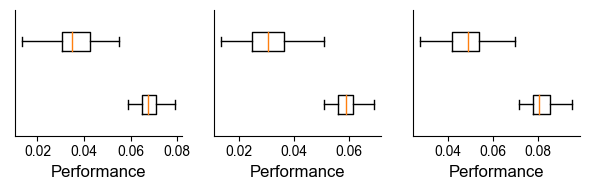

In [24]:
from sklearn.cross_decomposition import PLSRegression as PLS
func = [func_g1, func_g2, func_g3]
r_train = np.zeros((3,100))
r_test  = np.zeros((3,100))
for j in range(100):
    pls = [None] * len(func)
    for i in range(len(func)):
        pls[i] = PLS(n_components=1)
        x = np.array(pgs)[:,1:][split[j]==0]
        y = np.array(func[i])[:,3:][split[j]==0]
        pls[i].fit(Y=y, X=x)
        x_train, y_train = pls[i].transform(X=x, Y=y)
        x_test, y_test = pls[i].transform(X=np.array(pgs)[:,1:][split[j]==1], 
                                          Y=np.array(func[i])[:,3:][split[j]==1])
        r_train[i,j] = ss.pearsonr(x_train[:,0],y_train[:,0])[0]
        r_test[i,j] = ss.pearsonr(x_test[:,0],y_test[:,0])[0]

fig, ax = plt.subplots(1,3, figsize=(6,2))
for i in range(3):
    ax[i].boxplot([r_train[i],r_test[i]], widths=0.3, sym='', vert=False)
    ax[i].set_xlabel('Performance')
    ax[i].set_yticks([])
    #ax[i].set_ylabel('Gradient '+str(i+1))
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)

fig.tight_layout()
plt.savefig('../../figures/PLS_pgs_train_test.png', dpi=300, transparent=True)

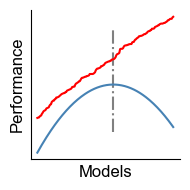

In [25]:
fig, ax = plt.subplots(1,1, figsize=(2,2))
x=np.random.randint(-200,100,180)
ax.plot(np.arange(-100,80,1), -x[x.argsort()][::-1]/20, color='red')
ax.plot(np.arange(-100,80,1), -(np.arange(-100,80,1)**2)/1000, color='steelblue')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_xticks([])
ax.set_yticks([])
ax.set_ylabel('Performance')
ax.set_xlabel('Models')
ax.vlines(x=0,ymin=-7,ymax=8,ls='-.',color='grey')

fig.tight_layout()
plt.savefig('../../figures/PLS_pgs_train_test.png', dpi=300, transparent=True)

In [30]:
rank = r_train.T - r_test.T
rank[r_test.T > r_train.T] = rank.min()
rank[rank.argsort(axis=0).mean(axis=1).argmax()]

array([0.01385335, 0.03985643, 0.02797985])

In [131]:
rank = (r_train.T-r_test.T)/r_train.T
rank[r_test.T > r_train.T] = rank.min()
select=rank.argsort(axis=0).mean(axis=1).argmax()
func = [func_g1, func_g2, func_g3]
pls = [None] * len(func)
x_train = [None] * len(func)
y_train = [None] * len(func)
x_test = [None] * len(func)
y_test = [None] * len(func)
for i in range(len(func)):
  pls[i] = PLS(n_components=1)
  x = np.array(pgs)[:,1:][split[select]==0]
  y = np.array(func[i])[:,3:][split[select]==0]
  pls[i].fit(Y=y, X=x)
  x_train[i], y_train[i] = pls[i].transform(X=x, Y=y)
  x_test[i], y_test[i] = pls[i].transform(X=np.array(pgs)[:,1:][split[select]==1], Y=np.array(func[i])[:,3:][split[select]==1])

pls_dis = PLS(n_components=1)
x = np.array(pgs)[:,1:]
y = np.array(ed)[:,12:]
pls_dis.fit(Y=y, X=x)
x_dis, y_dis = pls_dis.transform(X=x, Y=y)

train: PearsonRResult(statistic=0.06742301670125399, pvalue=5.637777076405004e-17)
test: PearsonRResult(statistic=0.03746982615588181, pvalue=3.479852122979068e-06)
train: PearsonRResult(statistic=0.06067755200251276, pvalue=4.9480637228470274e-14)
test: PearsonRResult(statistic=0.03184983568653105, pvalue=8.017070212275857e-05)
train: PearsonRResult(statistic=0.07622551984957182, pvalue=2.8345266371483385e-21)
test: PearsonRResult(statistic=0.0571996697123178, pvalue=1.3714518557303741e-12)


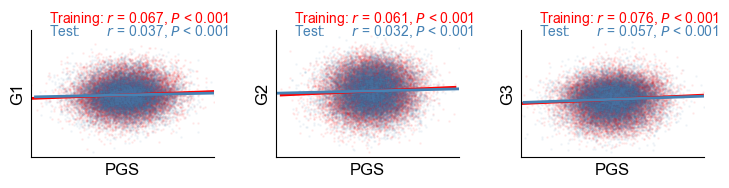

In [132]:
fig, ax = plt.subplots(1,3, figsize=(7.5,2))
for i in range(3):
  sns.regplot(x_train[i][:,0], y_train[i][:,0], ax = ax[i], 
              scatter_kws={'s': 1, 'color': 'red', 'alpha':0.05},
              line_kws={'lw': 2, 'color': 'red'})
  sns.regplot(x_test[i][:,0], y_test[i][:,0], ax = ax[i], 
              scatter_kws={'s': 1, 'color': 'steelblue', 'alpha':0.05},
              line_kws={'lw': 2, 'color': 'steelblue'})
  ax[i].tick_params(axis='both', labelsize=20)
  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)
  #ax.set_xlim(-0.6, 0.6)
  #ax.set_ylim(-0.1, 0.1)
  ax[i].set_yticks([])
  ax[i].set_xticks([])
  #ax.set_yticklabels(['-0.1', '0', '0.1'])
  ax[i].set_xlabel('PGS')
  ax[i].set_ylabel('G'+str(i+1))
  rp = ss.pearsonr(x_train[i][:,0],y_train[i][:,0])
  print('train:',rp)
  ax[i].text(0.1, 1.06, 'Training: $\it{r}$ = ' + '%.3f'%(rp[0])+', $\it{P}$ < 0.001', 
             c='red', transform=ax[i].transAxes)
  rp = ss.pearsonr(x_test[i][:,0],y_test[i][:,0])
  print('test:',rp)
  ax[i].text(0.1, 0.96, 'Test:       $\it{r}$ = ' + '%.3f'%(rp[0])+', $\it{P}$ < 0.001', 
             c='steelblue', transform=ax[i].transAxes)
fig.tight_layout()
plt.savefig('../../figures/PLS_pgs.png', dpi=300, transparent=True)

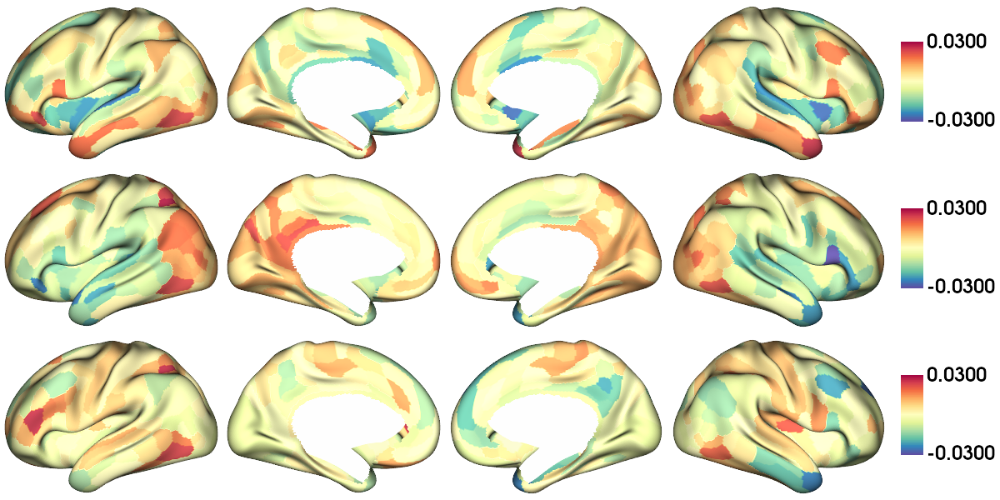

In [133]:
plot=[None] * 3
for i in range(3):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = pls[i].y_loadings_[:,0][node]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 600), color_range=(-0.03,0.03),
                cmap = 'Spectral_r', filename = '../../figures/pgs_pls_brain.png',
                display=True)

In [134]:
ca = np.array(pd.read_csv('../../src/ca_glasser_network.csv', header = None))[:,0]
network_name = np.array(['Vis1', 'Vis2', 'SMN', 'CON', 'DAN', 'Lan', 
                         'FPN', 'Aud', 'DMN', 'PMN', 'VMN', 'OAN'])
rgb = np.array(list(hcp.ca_network['rgba'].values())[1:])
def plot_t_multi(t_g1, t_g2, t_g3, t_g123, filename):
  rank = t_g123.argsort()[::-1]
  label_loc = np.linspace(start=0, stop=5.8, num=12)
  fig = plt.figure(figsize=(2, 2))
  ax = fig.add_subplot(projection='polar')
  plt.yticks(np.arange(-0.1, 0.1, 0.05))
  plt.bar(label_loc+0.1, t_g1[rank], width=0.1, bottom=0, alpha=1,
          color = rgb[rank])
  plt.bar(label_loc, t_g2[rank], width=0.15, bottom=0, alpha=0.5,
          color = rgb[rank])
  plt.bar(label_loc-0.1, t_g3[rank], width=0.15, bottom=0, alpha=0.3,
          color = rgb[rank])
  plt.plot(label_loc, (t_g123/3)[rank], marker='o', ms=2, color='gray',lw=1) 
  a = network_name[rank]
  lines, labels = plt.thetagrids(np.degrees(label_loc), labels = a)
  plt.yticks([0],[' '])
  #plt.ylim(-,4)
  ax.xaxis.grid(True, linestyle="-.", alpha=0.3, zorder=0) 
  for spine in ax.spines.values():
      spine.set_edgecolor('None')
  plt.tight_layout()
  plt.savefig(filename, dpi=300, transparent=True)

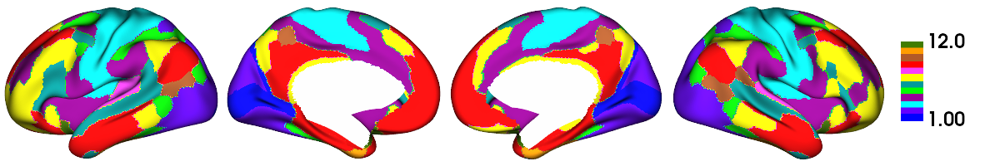

In [135]:
plot=mmp_fsLR.copy()
for i in range(360):
    plot[mmp_fsLR==i+1]=ca[i]
plot[mmp_fsLR==0]=np.nan

cmap12 = ListedColormap(rgb)
fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 200), color_range=(1,12),
                cmap = cmap12, filename = '../../figures/ca12.png',
                display=True)

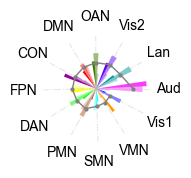

In [136]:
data_tmp=np.zeros((3,12))
for i in range(3):
  for j in range(12):  
    data_tmp[i,j] = abs(pls[i].y_loadings_[:,0][ca==j+1]).mean()
plot_t_multi(data_tmp[0],data_tmp[1],data_tmp[2],
             data_tmp[0]+data_tmp[1]+data_tmp[2],
             filename='../../figures/pgs_pls_brain_ca.png')

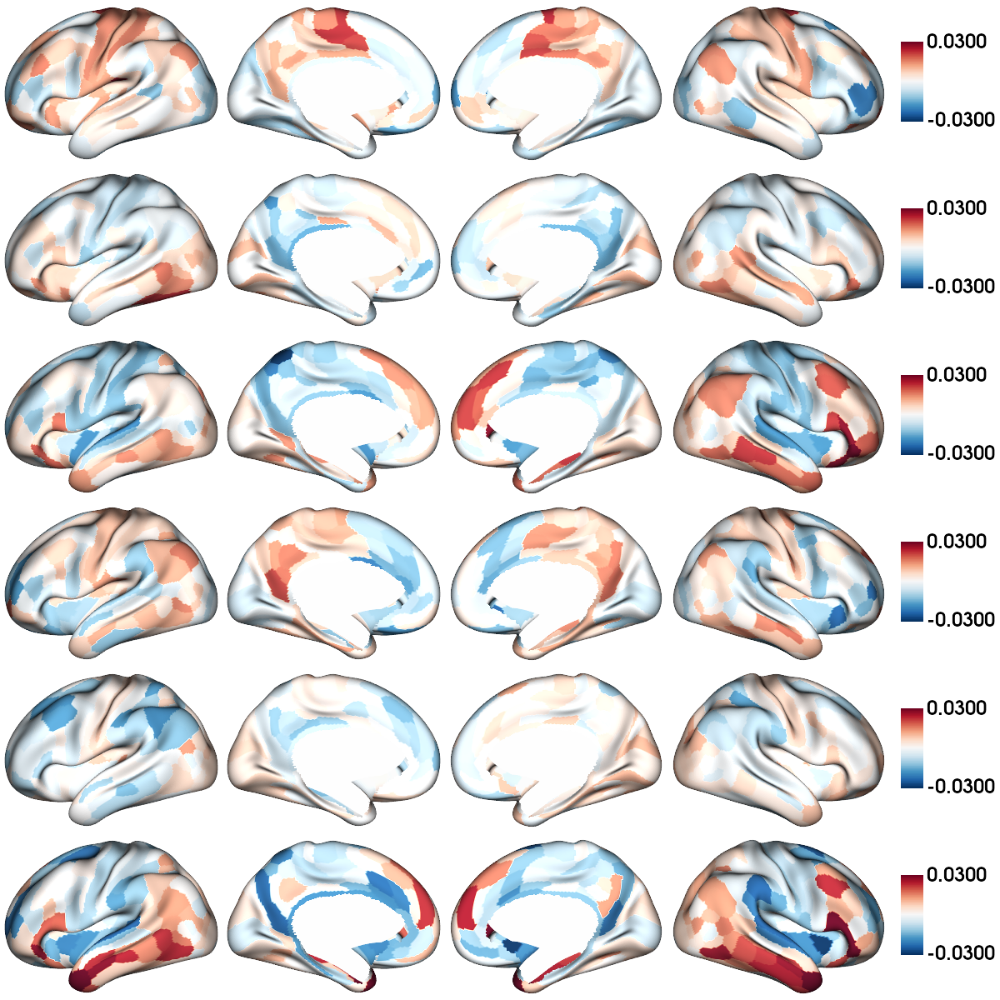

In [137]:
con = np.array(cols[1:])
model_g1 = [None] * 11
for i in range(11):
  # x = np.concatenate((pgs.drop(['IID',con[i]],axis=1),func_g1.drop(['FID','IID','r_HCP'],axis=1)),axis=1)
  x = np.array(func_g1.drop(['FID','IID','r_HCP'], axis=1))
  y = np.array(pgs[con[i]])
  model_g1[i] = np.zeros((360,2))
  for j in range(360):
    model_g1[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = model_g1[i][node][0]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 1200), color_range=(-0.03,0.03),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_g1_brain.png',
                display=True)

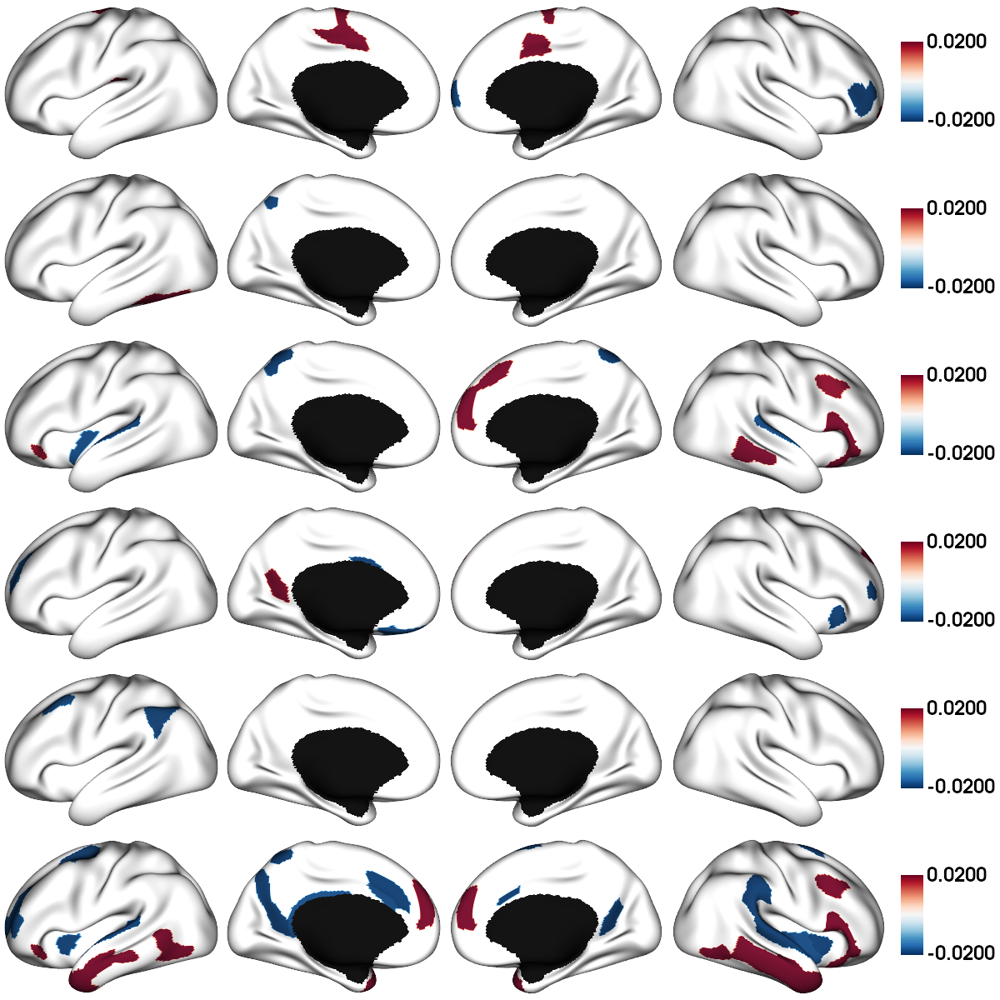

In [138]:
con = np.array(cols[1:])
model = [None] * 11
for i in range(11):
  # x = np.concatenate((pgs.drop(['IID',con[i]],axis=1),func_g1.drop(['FID','IID','r_HCP'],axis=1)),axis=1)
  x = np.array(func_g1.drop(['FID','IID','r_HCP'], axis=1))
  y = np.array(pgs[con[i]])
  model[i] = np.zeros((360,2))
  for j in range(360):
    model[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    tmp = model[i][node][0].copy()
    if model[i][node][1] > 0.001:
      tmp = 0
    plot[i][mmp_fsLR==node+1] = tmp
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR', nan_color=(0,0,0,1),
                size = (1200, 1200), color_range=(-0.02,0.02),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_g1_brain_thres.png',
                display=True)

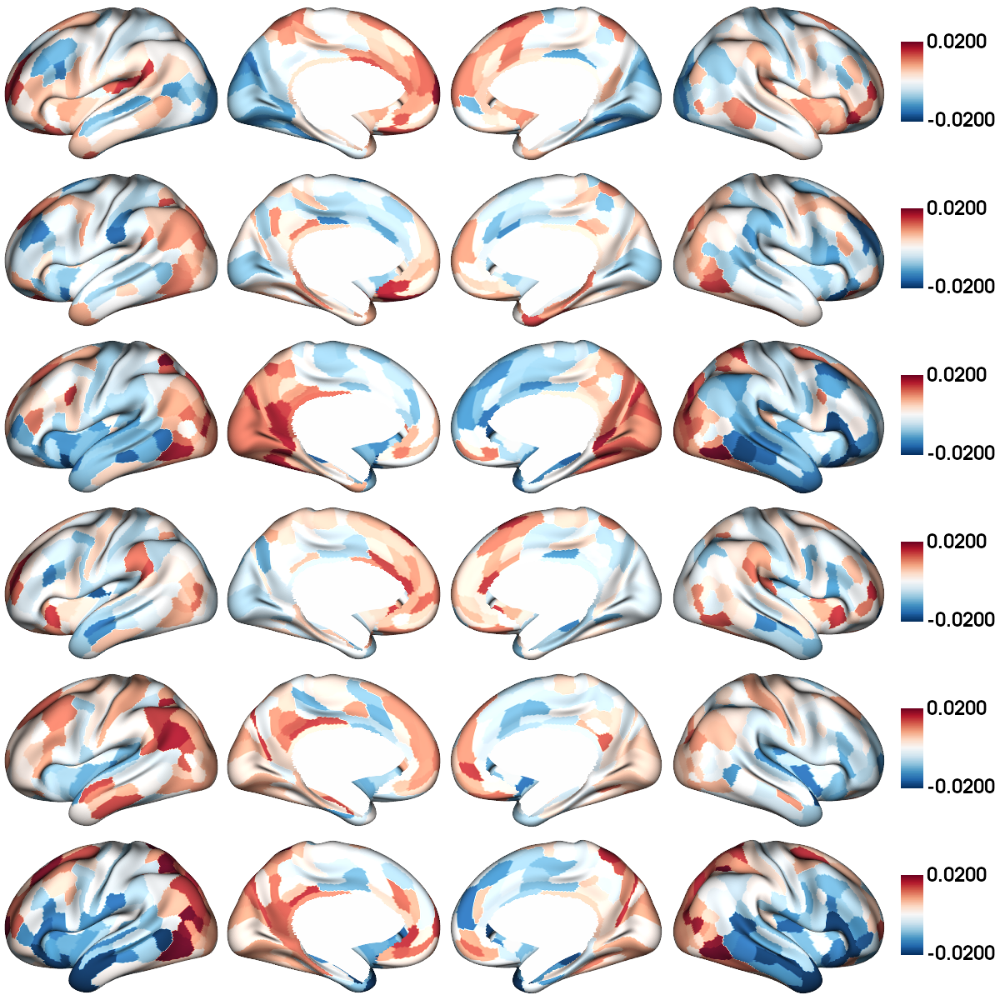

In [139]:
model_g2 = [None] * 11
for i in range(11):
  x = np.array(func_g2.drop(['FID','IID','r_HCP'], axis=1))
  y = np.array(pgs[con[i]])
  model_g2[i] = np.zeros((360,2))
  for j in range(360):
    model_g2[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = model_g2[i][node][0]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 1200), color_range=(-0.02,0.02),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_g2_brain.png',
                display=True)

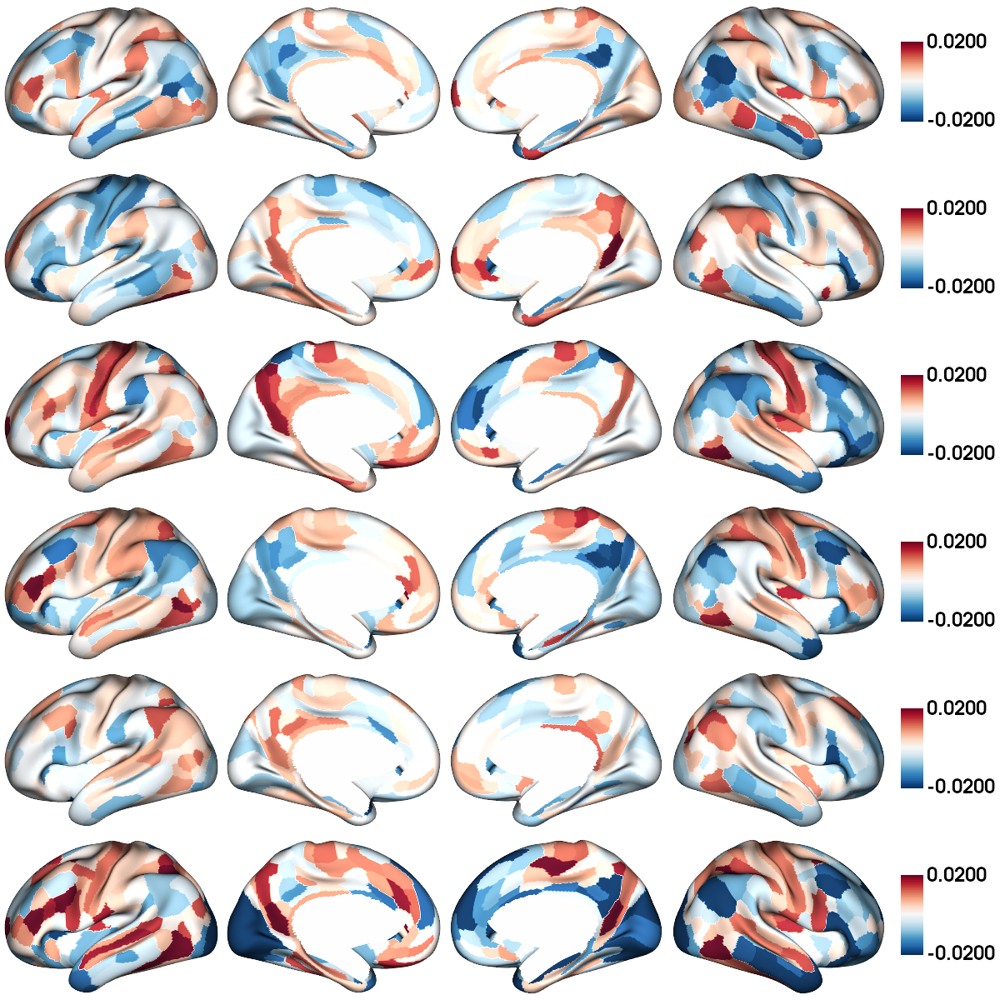

In [140]:
model_g3 = [None] * 11
for i in range(11):
  x = np.array(func_g3.drop(['FID','IID','r_HCP'], axis=1))
  y = np.array(pgs[con[i]])
  model_g3[i] = np.zeros((360,2))
  for j in range(360):
    model_g3[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = model_g3[i][node][0]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 1200), color_range=(-0.02,0.02),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_g3_brain.png',
                display=True)

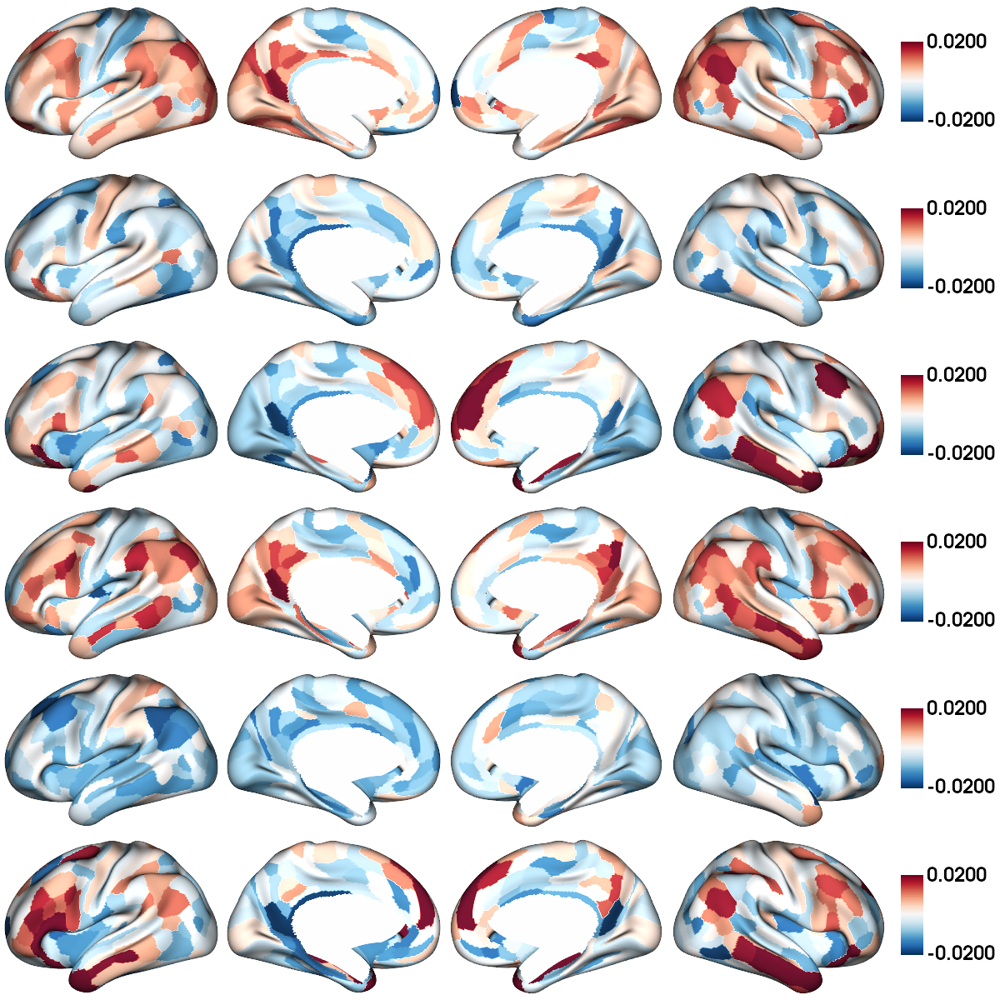

In [141]:
model_dis = [None] * 11
for i in range(11):
  x = np.array(ed[ed.columns[12:]])
  y = np.array(pgs[con[i]])
  model_dis[i] = np.zeros((360,2))
  for j in range(360):
    model_dis[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    plot[i][mmp_fsLR==node+1] = model_dis[i][node][0]
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 1200), color_range=(-0.02,0.02),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_dis_brain.png',
                display=True)

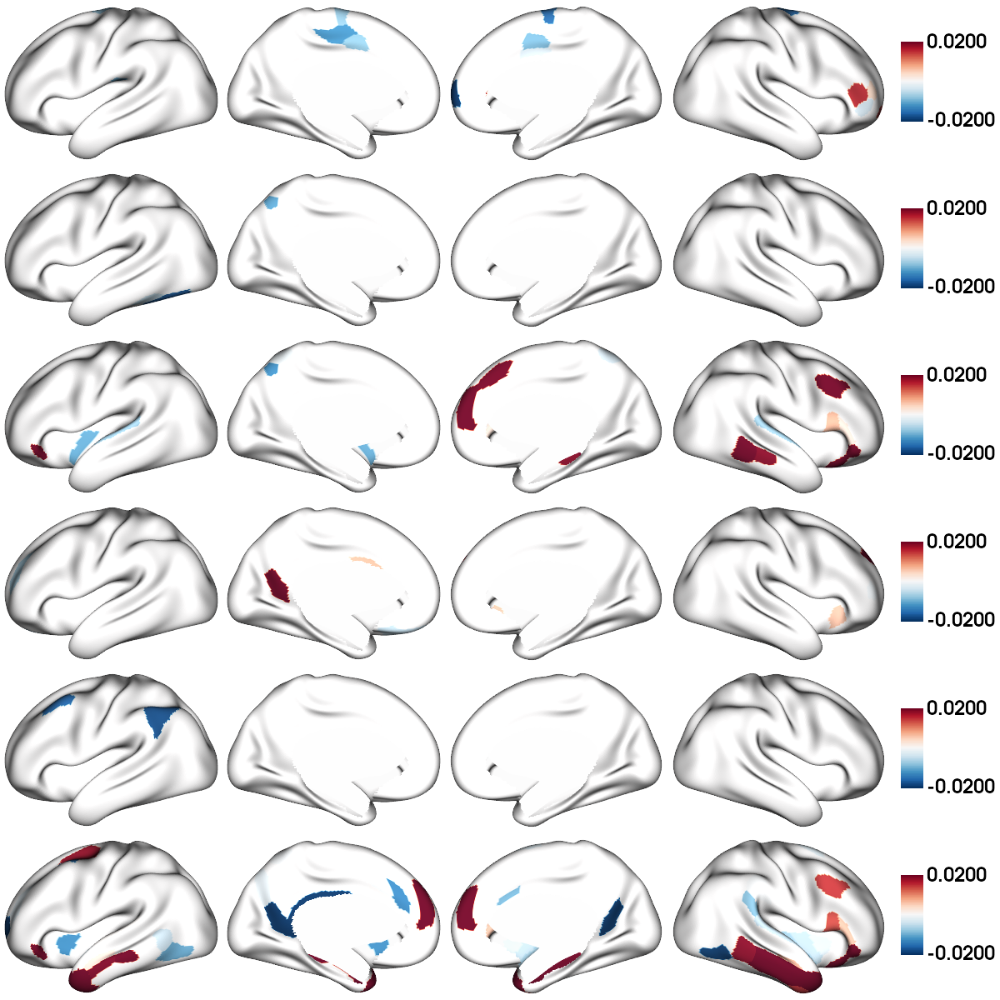

In [142]:
model_dis = [None] * 11
for i in range(11):
  x = np.array(ed[ed.columns[12:]])
  y = np.array(pgs[con[i]])
  model_dis[i] = np.zeros((360,2))
  for j in range(360):
    model_dis[i][j]=ss.pearsonr(y,x[:,j])

plot=[None] * 6
for i in range(6):
  plot[i] = mmp_fsLR.copy()
  for node in range(360):
    tmp = model_dis[i][node][0].copy()
    if model[i][node][1] > 0.001:
      tmp = 0
    plot[i][mmp_fsLR==node+1] = tmp
  plot[i][mmp_fsLR==0] = np.nan

fp.plot_surface(data = plot, surf='fsLR',
                size = (1200, 1200), color_range=(-0.02,0.02),
                cmap = 'RdBu_r', filename = '../../figures/pgs_corr_dis_brain_thres.png',
                display=True)

[[-0.038  0.107  0.221 -0.108  0.511  0.11   0.405  0.752  0.5    0.669
   0.829]
 [-0.293  0.269  0.498  0.482 -0.037  0.596  0.293  0.316  0.592  0.826
   0.871]
 [ 0.528  0.164  0.004  0.361  0.398  0.198  0.72   0.619  0.758  0.512
   0.797]]


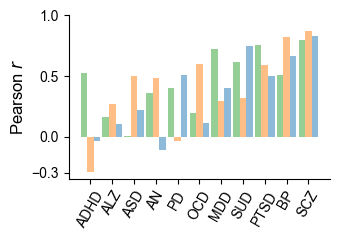

In [143]:
models=[model_g1,model_g2,model_g3]
corr_brain_psy = np.zeros((3,11))
for i in range(3):
  for j in range(11):
    corr_brain_psy[i,j] = ss.pearsonr(models[i][j][:,0], pls[i].y_loadings_[:,0])[0]

rank = corr_brain_psy[0] + corr_brain_psy[1] + corr_brain_psy[2]
rank = rank.argsort()

fig, ax = plt.subplots(1, figsize=(3.5,2.5))

ax.bar(np.arange(11)+0.3, corr_brain_psy[0][rank], width=0.3, label='G1', alpha=0.5)
ax.bar(np.arange(11), corr_brain_psy[1][rank], width=0.3, label='G2', alpha=0.5)
ax.bar(np.arange(11)-0.3, corr_brain_psy[2][rank], width=0.3, label='G3', alpha=0.5)

ax.set_xticks(np.arange(11))
ax.set_xticklabels(np.array(cols[1:])[rank], rotation=60)
ax.set_yticks([-0.3, 0, 0.5, 1])
ax.set_ylabel('Pearson $\it{r}$')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#ax.legend(loc='lower right', fontsize=20)
fig.tight_layout()
plt.savefig('../../figures/pgs_pls_psy.png', dpi=300, transparent=True)
print(corr_brain_psy.round(3)[:,rank])

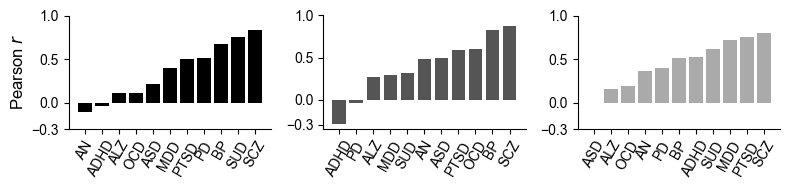

In [144]:
models=[model_g1,model_g2,model_g3]
corr_brain_psy = np.zeros((3,11))
for i in range(3):
  for j in range(11):
    corr_brain_psy[i,j] = ss.pearsonr(models[i][j][:,0], pls[i].y_loadings_[:,0])[0]

fig, ax = plt.subplots(1,3, figsize=(8,2))

for i in range(3):
  rank = corr_brain_psy[i].argsort()
  ax[i].bar(np.arange(11), corr_brain_psy[i][rank], width=0.8, color='black', alpha=1-i/3)
  ax[i].set_xticks(np.arange(11))
  ax[i].set_xticklabels(np.array(cols[1:])[rank], rotation=60)
  ax[i].set_yticks([-0.3, 0, 0.5, 1])
  #ax[i].set_ylabel('Pearson $\it{r}$')
  ax[i].spines['right'].set_visible(False)
  ax[i].spines['top'].set_visible(False)
ax[0].set_ylabel('Pearson $\it{r}$')
fig.tight_layout()
plt.savefig('../../figures/pgs_pls_psy_sep.png', dpi=300, transparent=True)

[0.13395367 0.15112911 0.23912613 0.33745093 0.35193168 0.37330083
 0.45061801 0.48744655 0.54667326 0.78310098 0.92236575]


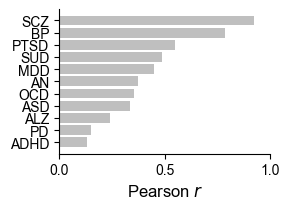

In [145]:
corr_brain_psy = np.zeros(11)
for j in range(11):
  corr_brain_psy[j] = ss.pearsonr(model_dis[j][:,0], pls_dis.y_loadings_[:,0])[0]

rank = corr_brain_psy.argsort()

fig, ax = plt.subplots(figsize=(3,2.2))

ax.barh(np.arange(11), corr_brain_psy[rank], height=0.8, alpha=0.5, color='grey')

ax.set_yticks(np.arange(11))
ax.set_yticklabels(np.array(cols[1:])[rank])
ax.set_xticks([0, 0.5, 1])
ax.set_xlabel('Pearson $\it{r}$')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#ax.legend(loc='lower right', fontsize=20)
fig.tight_layout()
plt.savefig('../../figures/pgs_pls_psy_dis.png', dpi=300, transparent=True)
print(corr_brain_psy[rank])

## Genetic correlation

In [125]:
gc = pd.read_csv('../../data/Ed_He_PGS/crosscorr_gradients.global_structural_disorders.txt', sep='\t')
gc_meta = ['Cortical_thickness','Fractional_anisotropy','Folding_index','Gaussian_curvature',
           'ICVF','ISOVF','Intrinsic curvature','LGI','Mean_diffusion','Mean_curvature','Orientation_dispersion',
           'Surface_area','Volume',
           'ADHD','ALZ','AN','ASD','BP','MDD','OCD',
           'PD','PTSD','SCZ','SUD']
gc

,group1,pheno1,group2,pheno2,rg,se,p,q
0,gradients,dist_g1,global_structural,CT,-0.0689,0.0889,0.438323,0.584431
1,gradients,dist_g1,global_structural,FA,-0.1565,0.1430,0.273777,0.584431
2,gradients,dist_g1,global_structural,Foldingindex,-0.1329,0.0823,0.106349,0.364625
3,gradients,dist_g1,global_structural,Gaussiancurvature,-0.0217,0.0762,0.775815,0.846344
4,gradients,dist_g1,global_structural,ICVF,0.0834,0.1283,0.515667,0.651369
...,...,...,...,...,...,...,...,...
139,gradients,g3,disorders,ocd2024,0.2366,0.2102,0.260337,0.511488
140,gradients,g3,disorders,pd2019,0.2095,0.1338,0.117403,0.352208
141,gradients,g3,disorders,ptsd2024,0.1147,0.0534,0.031719,0.152249
142,gradients,g3,disorders,scz2022,-0.0525,0.0483,0.277056,0.511488


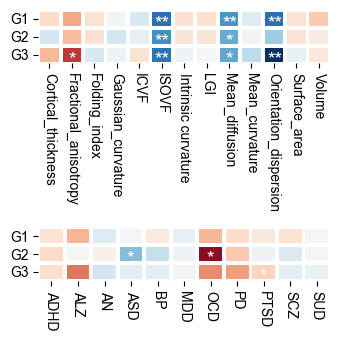

In [129]:
pfdr = np.zeros((3,len(gc_meta)))
p = np.zeros((3,len(gc_meta)))
rg = np.zeros((3,len(gc_meta)))
for i in range(3):
  p[i] = gc.p[gc.pheno1=='g'+str(i+1)]
  rg[i] = gc.rg[gc.pheno1=='g'+str(i+1)]
  pfdr[i] = gc.q[gc.pheno1=='g'+str(i+1)]

fig, ax = plt.subplots(2,1, figsize=(3.5,3.5))
sns.heatmap(rg.T[:13].T, vmax=0.5, vmin=-0.5, cmap='RdBu_r', linewidths=2, 
            ax=ax[0], cbar=False)
ax[0].set_yticklabels(['G1','G2','G3'], rotation=0)
ax[0].set_xticks(np.linspace(0.5,len(gc_meta[:13])-0.5,len(gc_meta[:13])))
ax[0].set_xticklabels(gc_meta[:13], rotation=270)

sns.heatmap(rg.T[13:].T, vmax=0.5, vmin=-0.5, cmap='RdBu_r', linewidths=2,
            ax=ax[1], cbar=False)
ax[1].set_yticklabels(['G1','G2','G3'], rotation=0)
ax[1].set_xticks(np.linspace(0.5,len(gc_meta[13:])-0.5,len(gc_meta[13:])))
ax[1].set_xticklabels(gc_meta[13:], rotation=270)

for i in range(len(gc_meta[:13])):
  for j in range(3):
    if p[j,i] < 0.05 and pfdr[j,i] < 0.05:
      ax[0].text(i+0.2,j+1.1,'**', color='white', fontsize=14)
    elif p[j,i] < 0.05 and pfdr[j,i] > 0.05:
      ax[0].text(i+0.34,j+1.1,'*', color='white', fontsize=14)
for i in range(len(gc_meta[13:])):
  for j in range(3):
    if p[:,13:][j,i] < 0.05 and pfdr[:,13:][j,i] < 0.05:
      ax[1].text(i+0.2,j+1.1,'**', color='white', fontsize=14)
    elif p[:,13:][j,i] < 0.05 and pfdr[:,13:][j,i] > 0.05:
      ax[1].text(i+0.34,j+1.1,'*', color='white', fontsize=14)

fig.tight_layout()
plt.savefig('../../figures/gc_01.png', dpi=300, transparent=True)

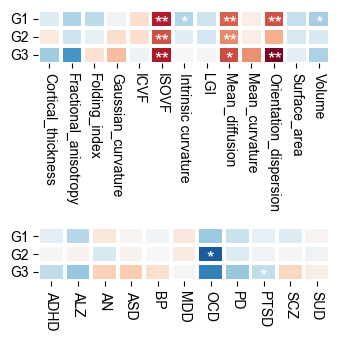

In [130]:
pfdr = np.zeros((3,len(gc_meta)))
p = np.zeros((3,len(gc_meta)))
rg = np.zeros((3,len(gc_meta)))
for i in range(3):
  p[i] = gc.p[gc.pheno1=='dist_g'+str(i+1)]
  rg[i] = gc.rg[gc.pheno1=='dist_g'+str(i+1)]
  pfdr[i] = gc.q[gc.pheno1=='dist_g'+str(i+1)]

fig, ax = plt.subplots(2,1, figsize=(3.5,3.5))
sns.heatmap(rg.T[:13].T, vmax=0.5, vmin=-0.5, cmap='RdBu_r', linewidths=2, 
            ax=ax[0], cbar=False)
ax[0].set_yticklabels(['G1','G2','G3'], rotation=0)
ax[0].set_xticks(np.linspace(0.5,len(gc_meta[:13])-0.5,len(gc_meta[:13])))
ax[0].set_xticklabels(gc_meta[:13], rotation=270)

sns.heatmap(rg.T[13:].T, vmax=0.5, vmin=-0.5, cmap='RdBu_r', linewidths=2,
            ax=ax[1], cbar=False)
ax[1].set_yticklabels(['G1','G2','G3'], rotation=0)
ax[1].set_xticks(np.linspace(0.5,len(gc_meta[13:])-0.5,len(gc_meta[13:])))
ax[1].set_xticklabels(gc_meta[13:], rotation=270)

for i in range(len(gc_meta[:13])):
  for j in range(3):
    if p[j,i] < 0.05 and pfdr[j,i] < 0.05:
      ax[0].text(i+0.2,j+1.1,'**', color='white', fontsize=14)
    elif p[j,i] < 0.05 and pfdr[j,i] > 0.05:
      ax[0].text(i+0.34,j+1.1,'*', color='white', fontsize=14)
for i in range(len(gc_meta[13:])):
  for j in range(3):
    if p[:,13:][j,i] < 0.05 and pfdr[:,13:][j,i] < 0.05:
      ax[1].text(i+0.2,j+1.1,'**', color='white', fontsize=14)
    elif p[:,13:][j,i] < 0.05 and pfdr[:,13:][j,i] > 0.05:
      ax[1].text(i+0.34,j+1.1,'*', color='white', fontsize=14)

fig.tight_layout()
plt.savefig('../../figures/gc_dis.png', dpi=300, transparent=True)

['dist_g1' 'dist_g2' 'dist_g3' 'g1' 'g2' 'g3']


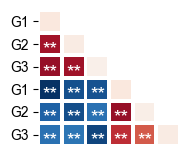

In [124]:
gc = pd.read_csv('../../data/Ed_He_PGS/corr_gradients.txt', sep='\t')
print(np.unique(gc.pheno1))
tmp=[]
for i in np.unique(gc.pheno1):
  for j in np.unique(gc.pheno1):
    try:
      tmp.append(list(gc.rg[np.logical_and(gc.pheno1==i, gc.pheno2==j)])[0])
    except:
      tmp.append(np.nan) 
tmp = np.array(tmp).reshape(6,6)

fig, ax = plt.subplots(figsize=(2,1.7))
sns.heatmap(tmp, vmax=1, vmin=-1, cmap='RdBu_r', linewidths=2, 
            ax=ax, cbar=False)

ax.set_xticks([])
ax.set_yticklabels(['G1','G2','G3','G1','G2','G3'], rotation=0)

for i in range(6):
  for j in range(i):
      ax.text(j+0.2,i+1,'**', color='white', fontsize=14)

fig.tight_layout()
plt.savefig('../../figures/gc_self.png', dpi=300, transparent=True)

## BrainSpan development

In [ ]:
brainspan = pd.read_csv('../../results/bs_age_avg_normRPKM_exp_GWAS.txt', sep='\t')
develop = brainspan[brainspan.columns[2:]].T
develop.columns = brainspan.symbol
develop

symbol,UFL1,TBC1D12,FHL5,HELLS,PLCE1,GNA12,FUT9,NOC3L,AMZ1,FAM200A
8_pcw,0.475265,-0.192956,-0.978830,1.869427,0.936719,0.423929,0.178580,1.084042,-0.413875,0.758217
9_pcw,0.538602,0.051920,-0.933036,2.134481,1.787566,0.391197,1.019964,0.947703,0.119975,0.295549
12_pcw,-0.103629,0.550834,-0.920565,0.148814,-0.062679,-0.056244,0.542600,0.546685,-0.344181,0.859042
13_pcw,-0.475359,0.149605,-0.933969,0.262459,0.184774,-0.192988,0.258887,0.196333,-0.396265,0.559476
16_pcw,-0.420551,-0.060351,-0.838478,0.328599,0.257160,0.147642,0.109780,0.016894,-0.215161,0.287278
17_pcw,-0.442160,-0.203712,-0.847941,0.340885,0.178263,0.224374,-0.379022,-0.054786,-0.189638,0.315428
19_pcw,-1.031949,-0.869984,-0.953255,0.034795,-0.355609,-0.410311,-0.876642,-0.441580,-0.344210,0.107590
21_pcw,-0.099610,-0.032749,-0.657028,0.162956,0.276649,0.149949,0.326170,-0.001634,-0.155277,0.138528
24_pcw,-0.358070,0.067816,-0.673785,0.110521,-0.050350,-0.013193,-0.399066,-0.131498,-0.365771,0.326457
26_pcw,0.281499,0.350648,0.224997,0.135336,0.613546,0.603216,-0.279821,0.441758,0.326352,-0.118135


In [ ]:
name = ['PLCE1','NOC3L','FAM200A',
        'UFL1','FHL5','FUT9',
        'TBC1D12','HELLS','GNA12','AMZ1']
grad_express = np.zeros((3,29))
for g in range(3):
  glm = ols(hcp_grad[:,g])
  y=hcp_grad[:,g-1]
  x=df_genes[np.array(name)[glm[2].pvalue < 0.05]].dropna()
  model_actual=OLS(y[x.index], np.array(x)).fit()
  grad_express[g] = np.sum(np.array(develop[x.columns]) * model_actual.tvalues, axis=1)
  #grad_express[g] = model_actual.predict(develop[x.columns])

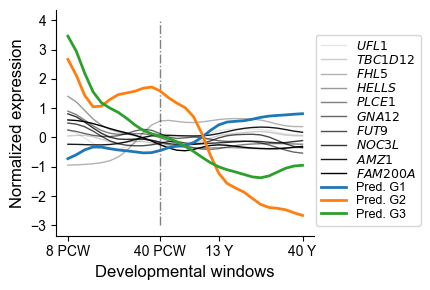

In [ ]:
fig, ax = plt.subplots(1, figsize=(4,3))

for i in range(len(brainspan.symbol)):
  ax.plot(range(29), gaussian_filter1d(brainspan[brainspan.columns[2:]].loc[i], sigma=2), 
          label='$\it{'+brainspan.symbol[i]+'}$', color='black', lw=1, alpha=0.1*(i+1))
for i in range(3):
  ax.plot(range(29), gaussian_filter1d(grad_express[i], sigma=2), 
          label='Pred. G'+str(i+1), lw=2)
  #ax.plot(range(29), grad_express[i], 
  #        label='Pred. G'+str(i+1)+'. raw', lw=2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([0,11,18,28])
ax.set_xticklabels(['8 PCW','40 PCW','13 Y','40 Y'])
ax.vlines(x=11, ymin=-3, ymax=4, ls='-.',color='grey', lw=1)

ax.set_xlabel('Developmental windows')
ax.set_ylabel('Normalized expression')

ax.legend(bbox_to_anchor=(1.08,0.55), loc='center right',
          bbox_transform=fig.transFigure, labelspacing=0.1, fontsize=9)

fig.tight_layout()
plt.savefig('../../figures/brainspan29.png', bbox_inches="tight", dpi=300, transparent=True)

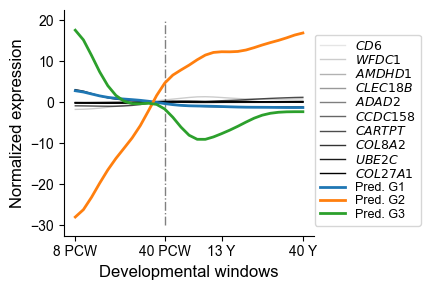

In [ ]:
brainspan = pd.read_csv('../../results/bs_age_avg_normRPKM_exp.txt', sep='\t')
develop = brainspan[brainspan.columns[2:]].T
develop.columns = brainspan.symbol
name = np.loadtxt('../../results/gene_name_L1_0.5.txt', dtype=str)
grad_express = np.zeros((3,29))
for g in range(3):
  glm = ols(hcp_grad[:,g], x=allen[name].dropna())
  y=hcp_grad[:,g-1]
  x=allen[np.array(name)[glm[2].pvalue < 0.05]].dropna()
  model_actual=OLS(y[x.index], np.array(x)).fit()
  grad_express[g] = np.sum(np.array(develop[x.columns]) * model_actual.tvalues, axis=1)
  glm = ols(hcp_grad[:,g])
  y=hcp_grad[:,g-1]
  x=allen[name].dropna()
  model_actual=OLS(y[x.index], np.array(x)).fit()
  grad_express[g] = np.sum(np.array(develop[x.columns]) * model_actual.tvalues, axis=1)

fig, ax = plt.subplots(1, figsize=(4,3))

for i in range(len(brainspan.symbol)):
  ax.plot(range(29), gaussian_filter1d(brainspan[brainspan.columns[2:]].loc[i], sigma=2), 
          label='$\it{'+brainspan.symbol[i]+'}$', color='black', lw=1, alpha=0.1*(i+1))
for i in range(3):
  ax.plot(range(29), gaussian_filter1d(grad_express[i], sigma=2), 
          label='Pred. G'+str(i+1), lw=2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([0,11,18,28])
ax.set_xticklabels(['8 PCW','40 PCW','13 Y','40 Y'])
ax.vlines(x=11, ymin=-30, ymax=20, ls='-.',color='grey', lw=1)

ax.set_xlabel('Developmental windows')
ax.set_ylabel('Normalized expression')

ax.legend(bbox_to_anchor=(1.08,0.55), loc='center right',
          bbox_transform=fig.transFigure, labelspacing=0.1,fontsize=9)

fig.tight_layout()
plt.savefig('../../figures/brainspan29_datadriven.png', bbox_inches="tight", dpi=300, transparent=True)